In [1]:
import sys
import os
from glob import glob
sys.path.append("../NEAT")
from NEATModels import NEATFocus, nets
from NEATModels.config import dynamic_config
from NEATUtils import helpers
from NEATUtils.helpers import save_json, load_json
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"


Using TensorFlow backend.


In [2]:
npz_directory = '/home/sancere/Kepler/CurieTrainingDatasets/foconeatnpz/'
npz_name = 'Foconeat.npz'
npz_val_name = 'FoconeatVal.npz'

#Read and Write the h5 file, directory location and name
model_dir =  '/home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/'
model_name = 'cadhistoned29s4f16res.h5'

In [3]:
#Neural network parameters
focus_categories_json = model_dir + 'FocusCategories.json'
key_categories = load_json(focus_categories_json)
focus_cord_json = model_dir + 'FocusCord.json'
key_cord = load_json(focus_cord_json)

#For ORNET use residual = True and for OSNET use residual = False
residual = True
#NUmber of starting convolutional filters, is doubled down with increasing depth
startfilter = 16
#CNN network start layer, mid layers and lstm layer kernel size
start_kernel = 7

mid_kernel = 3
#Network depth has to be 9n + 2, n= 3 or 4 is optimal for Notum dataset
depth = 29
#Size of the gradient descent length vector, start small and use callbacks to get smaller when reaching the minima
learning_rate = 1.0E-3
#For stochastic gradient decent, the batch size used for computing the gradients
batch_size = 10

#Training epochs, longer the better with proper chosen learning rate
epochs = 250
nboxes = 1
#The inbuilt model stride which is equal to the nulber of times image was downsampled by the network
show = True
stage_number = 4
last_conv_factor = 8
size_tminus = 1
size_tplus = 1
imagex = 96
imagey = 96


In [4]:

config = dynamic_config(npz_directory =npz_directory, npz_name = npz_name, npz_val_name = npz_val_name, 
                         key_categories = key_categories, key_cord = key_cord,  imagex = imagex,
                         imagey = imagey, size_tminus = size_tminus, size_tplus =size_tplus, epochs = epochs,
                         residual = residual, depth = depth, start_kernel = start_kernel, mid_kernel = mid_kernel, stage_number = stage_number, last_conv_factor = last_conv_factor,
                         show = show, startfilter = startfilter, batch_size = batch_size, model_name = model_name)

config_json = config.to_json()

print(config)
save_json(config_json, model_dir + os.path.splitext(model_name)[0] + '_Parameter.json')

dynamic_config(batch_size=10, box_vector=6, categories=3, depth=29, epochs=250, imagex=96, imagey=96, key_categories={'Totaloff': 0, 'BestCad': 1, 'BestNuclei': 2}, key_cord={'x': 0, 'y': 1, 'z': 2, 'h': 3, 'w': 4, 'c': 5}, last_conv_factor=8, learning_rate=0.0001, lstm_hidden_unit=16, lstm_kernel=3, mid_kernel=3, model_name='cadhistoned29s4f16res.h5', multievent=False, nboxes=1, npz_directory='/home/sancere/Kepler/CurieTrainingDatasets/foconeatnpz/', npz_name='Foconeat.npz', npz_val_name='FoconeatVal.npz', residual=True, show=True, size_tminus=1, size_tplus=1, stage_number=4, start_kernel=7, startfilter=16, stride=8, yolo_v0=True, yolo_v1=False, yolo_v2=False)


number of  images:	 10819
image size (3D):		 (3, 96, 96)
axes:				 SZYXC
channels in / out:		 1
number of  images:	 570
image size (3D):		 (3, 96, 96)
axes:				 SZYXC
channels in / out:		 1
(3, 96, 96, 1)
loading weights


2021-08-26 21:27:03.263016: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-08-26 21:27:03.330298: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:73:00.0 name: Quadro RTX 6000 computeCapability: 7.5
coreClock: 1.77GHz coreCount: 72 deviceMemorySize: 23.65GiB deviceMemoryBandwidth: 625.94GiB/s
2021-08-26 21:27:03.330540: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2021-08-26 21:27:03.332004: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2021-08-26 21:27:03.333454: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10
2021-08-26 21:27:03.333733: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10
2

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 3, None, None 0                                            
__________________________________________________________________________________________________
conv3d_1 (Conv3D)               (None, 3, None, None 5504        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 3, None, None 64          conv3d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 3, None, None 0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

Train on 10819 samples, validate on 570 samples
Epoch 1/250


2021-08-26 21:27:29.867087: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudnn.so.7
2021-08-26 21:27:31.638424: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10


10819/10819 [==============================] - 186s 17ms/step - loss: 1.6366 - accuracy: 0.0385 - val_loss: 1.5618 - val_accuracy: 0.0000e+00

Epoch 00001: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


<Figure size 432x288 with 0 Axes>

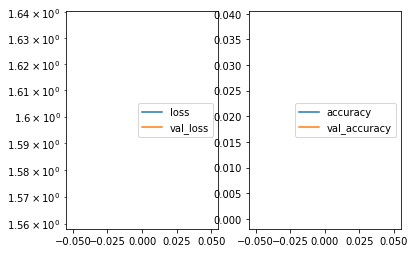

[[7.7618617e-01 2.2378775e-01 2.6105863e-05 5.0505412e-01 4.9856877e-01
  4.9964857e-01 9.9997413e-01 9.9983418e-01 4.4064397e-01]]
True Cell type: Totaloff
x [[[0.5050541]]]
True positional value x 0.5
y [[[0.49856877]]]
True positional value y 0.5
z [[[0.49964857]]]
True positional value z 0.5
h [[[0.99997413]]]
True positional value h 1.0
w [[[0.9998342]]]
True positional value w 1.0
c [[[0.44064397]]]
True positional value c 1.0


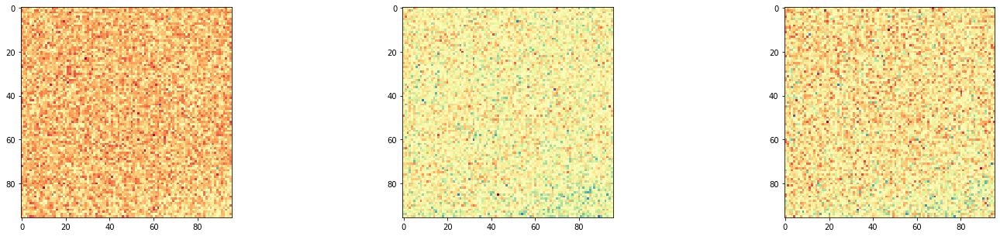

Epoch 2/250
10819/10819 [==============================] - 171s 16ms/step - loss: 1.3899 - accuracy: 0.1490 - val_loss: 1.4068 - val_accuracy: 0.0789

Epoch 00002: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


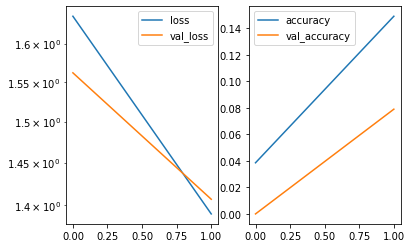

[[3.5087489e-06 5.6628749e-04 9.9943012e-01 4.8780954e-01 4.8769242e-01
  4.4629106e-01 9.9945253e-01 9.9811375e-01 5.0125253e-01]]
True Cell type: BestNuclei
x [[[0.48780954]]]
True positional value x 0.5
y [[[0.48769242]]]
True positional value y 0.5
z [[[0.44629106]]]
True positional value z 0.5
h [[[0.99945253]]]
True positional value h 1.0
w [[[0.99811375]]]
True positional value w 1.0
c [[[0.50125253]]]
True positional value c 1.0


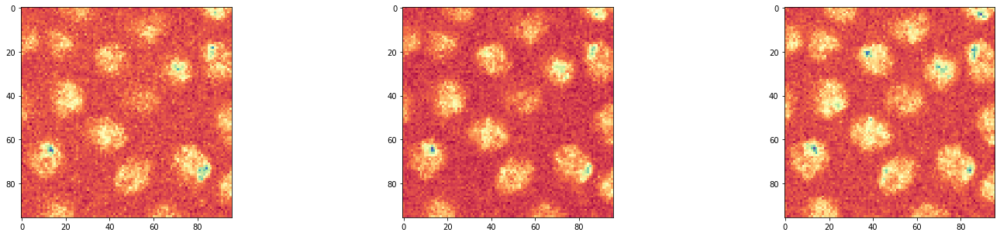

Epoch 3/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.3581 - accuracy: 0.2379 - val_loss: 1.3260 - val_accuracy: 0.0702

Epoch 00003: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


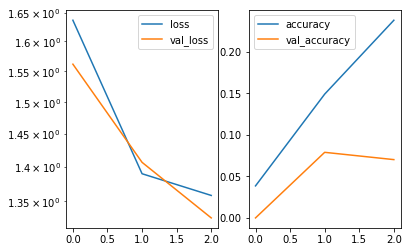

[[2.1174460e-08 4.4719651e-05 9.9995530e-01 5.1227140e-01 5.3512090e-01
  4.8249513e-01 9.9996936e-01 9.9981350e-01 4.8892960e-01]]
True Cell type: BestNuclei
x [[[0.5122714]]]
True positional value x 0.5
y [[[0.5351209]]]
True positional value y 0.5
z [[[0.48249513]]]
True positional value z 0.5
h [[[0.99996936]]]
True positional value h 1.0
w [[[0.9998135]]]
True positional value w 1.0
c [[[0.4889296]]]
True positional value c 1.0


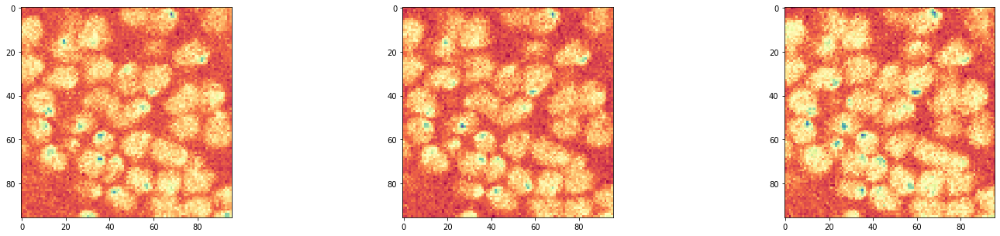

Epoch 4/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.3334 - accuracy: 0.2868 - val_loss: 1.3240 - val_accuracy: 0.0982

Epoch 00004: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


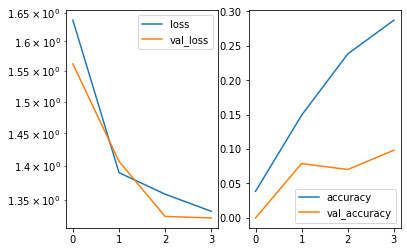

[[9.9994648e-01 5.3505151e-05 4.5229454e-10 4.9852428e-01 4.8061311e-01
  5.0834876e-01 9.9999523e-01 9.9995637e-01 4.5489150e-01]]
True Cell type: Totaloff
x [[[0.49852428]]]
True positional value x 0.5
y [[[0.4806131]]]
True positional value y 0.5
z [[[0.50834876]]]
True positional value z 0.5
h [[[0.99999523]]]
True positional value h 1.0
w [[[0.99995637]]]
True positional value w 1.0
c [[[0.4548915]]]
True positional value c 1.0


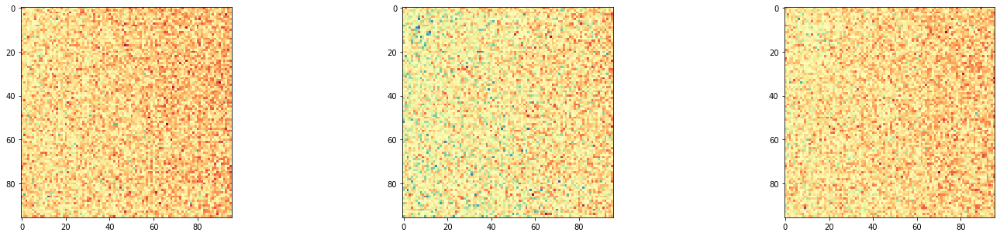

Epoch 5/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.3204 - accuracy: 0.3315 - val_loss: 4.7304 - val_accuracy: 0.1000

Epoch 00005: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


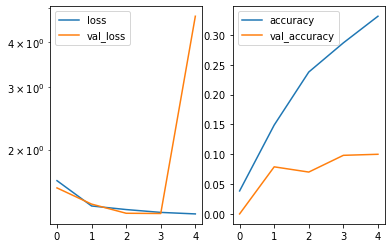

[[0.01736179 0.9673561  0.01528214 0.5028822  0.47944108 0.5005826
  0.99985576 0.9992755  0.45648712]]
True Cell type: Totaloff
x [[[0.5028822]]]
True positional value x 0.5
y [[[0.47944108]]]
True positional value y 0.5
z [[[0.5005826]]]
True positional value z 0.5
h [[[0.99985576]]]
True positional value h 1.0
w [[[0.9992755]]]
True positional value w 1.0
c [[[0.45648712]]]
True positional value c 1.0


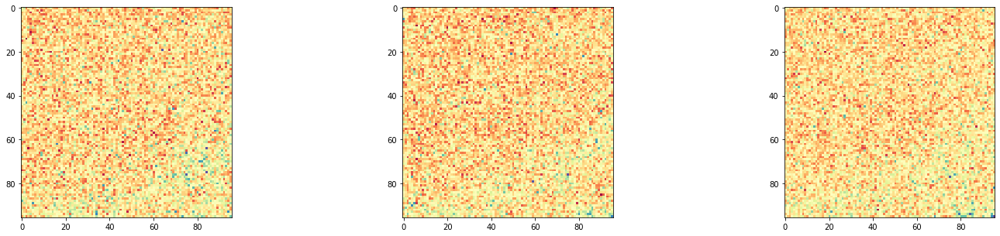

Epoch 6/250
10819/10819 [==============================] - 171s 16ms/step - loss: 1.3233 - accuracy: 0.3610 - val_loss: 2.3612 - val_accuracy: 0.8000

Epoch 00006: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


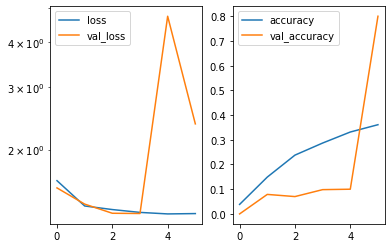

Predicted cell: Totaloff Probability: [[[[1.         0.         0.         0.50380254 0.53157085 0.51204574
    1.         0.99999964 0.41360542]]]]
True Cell type: Totaloff
x [[[0.50380254]]]
True positional value x 0.5
y [[[0.53157085]]]
True positional value y 0.5
z [[[0.51204574]]]
True positional value z 0.5
h [[[1.]]]
True positional value h 1.0
w [[[0.99999964]]]
True positional value w 1.0
c [[[0.41360542]]]
True positional value c 1.0


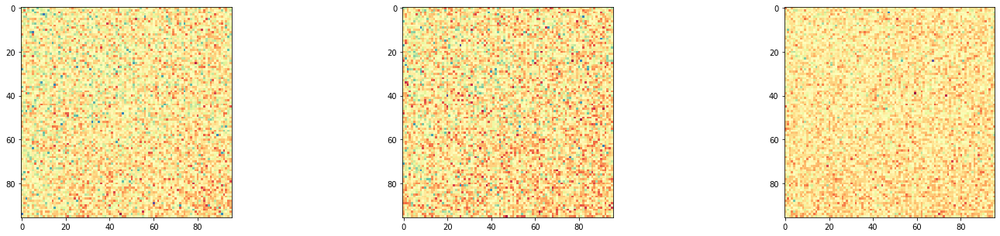

Epoch 7/250
10819/10819 [==============================] - 171s 16ms/step - loss: 1.3164 - accuracy: 0.3138 - val_loss: 1.3368 - val_accuracy: 0.3000

Epoch 00007: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


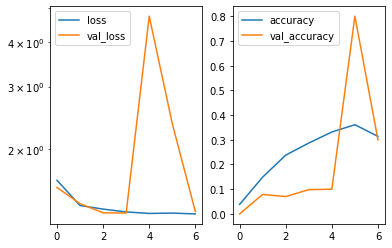

[[0.00456026 0.7855113  0.20992841 0.5104167  0.49573034 0.51272494
  0.9998889  0.9993668  0.4848935 ]]
True Cell type: BestCad
x [[[0.5104167]]]
True positional value x 0.5
y [[[0.49573034]]]
True positional value y 0.5
z [[[0.51272494]]]
True positional value z 0.5
h [[[0.9998889]]]
True positional value h 1.0
w [[[0.9993668]]]
True positional value w 1.0
c [[[0.4848935]]]
True positional value c 1.0


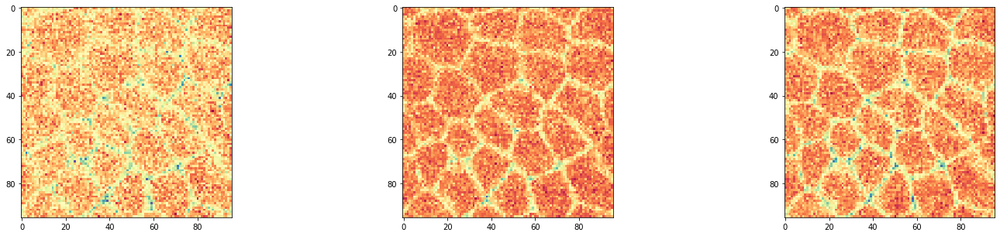

Epoch 8/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.3022 - accuracy: 0.4705 - val_loss: 14.6411 - val_accuracy: 0.1263

Epoch 00008: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


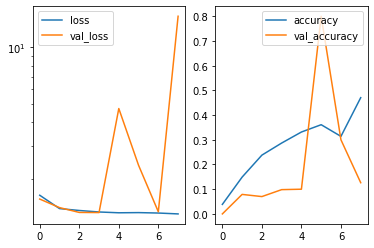

[[1.8804987e-14 8.0590882e-21 1.0000000e+00 5.0993186e-01 5.0416827e-01
  5.0064015e-01 9.9999940e-01 9.9999177e-01 4.3638134e-01]]
True Cell type: BestCad
x [[[0.50993186]]]
True positional value x 0.5
y [[[0.5041683]]]
True positional value y 0.5
z [[[0.50064015]]]
True positional value z 0.5
h [[[0.9999994]]]
True positional value h 1.0
w [[[0.9999918]]]
True positional value w 1.0
c [[[0.43638134]]]
True positional value c 1.0


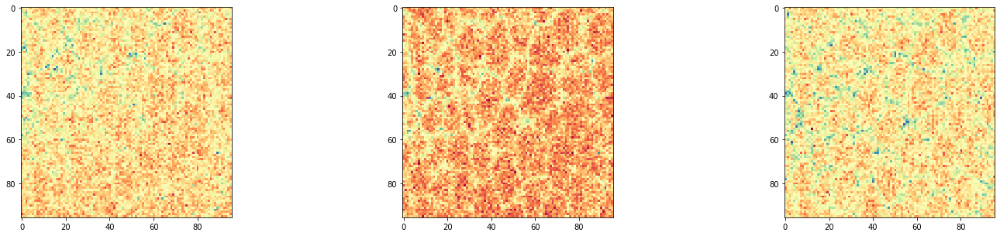

Epoch 9/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2951 - accuracy: 0.3456 - val_loss: 1.2891 - val_accuracy: 0.2614

Epoch 00009: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


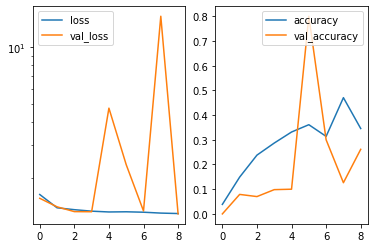

[[9.9874336e-01 1.2565724e-03 1.5021855e-07 4.9282709e-01 4.9825019e-01
  4.9667028e-01 9.9999917e-01 9.9998677e-01 5.0754654e-01]]
True Cell type: Totaloff
x [[[0.4928271]]]
True positional value x 0.5
y [[[0.4982502]]]
True positional value y 0.5
z [[[0.49667028]]]
True positional value z 0.5
h [[[0.99999917]]]
True positional value h 1.0
w [[[0.99998677]]]
True positional value w 1.0
c [[[0.50754654]]]
True positional value c 1.0


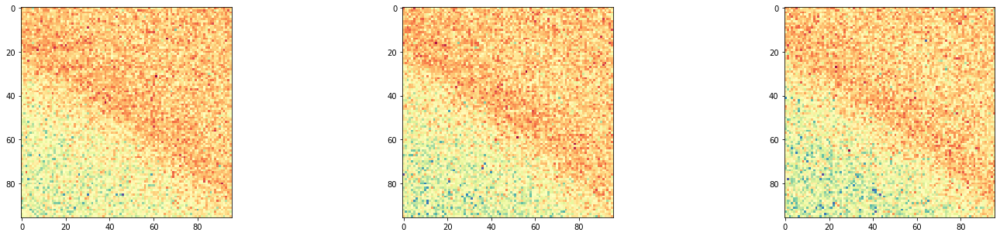

Epoch 10/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2859 - accuracy: 0.5645 - val_loss: 1.4043 - val_accuracy: 0.1281

Epoch 00010: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


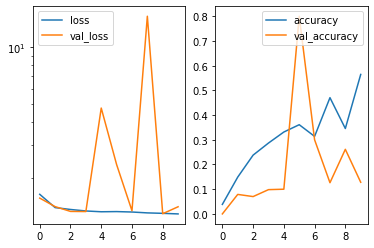

[[4.8385195e-11 2.3195122e-10 1.0000000e+00 4.6847096e-01 5.0582629e-01
  5.2011979e-01 9.9991763e-01 9.9947256e-01 5.0555527e-01]]
True Cell type: BestNuclei
x [[[0.46847096]]]
True positional value x 0.5
y [[[0.5058263]]]
True positional value y 0.5
z [[[0.5201198]]]
True positional value z 0.5
h [[[0.9999176]]]
True positional value h 1.0
w [[[0.99947256]]]
True positional value w 1.0
c [[[0.5055553]]]
True positional value c 1.0


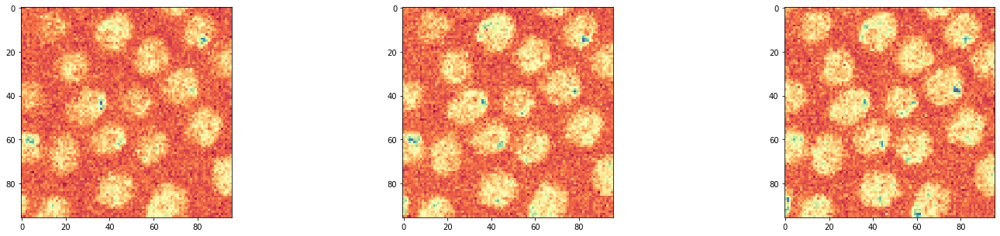

Epoch 11/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2800 - accuracy: 0.5501 - val_loss: 1.2728 - val_accuracy: 0.5105

Epoch 00011: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


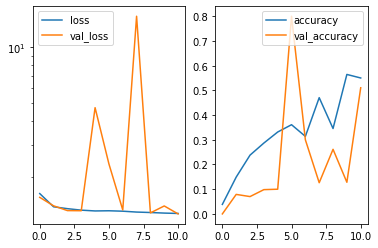

[[8.1194642e-09 3.7744166e-10 1.0000000e+00 4.9789479e-01 4.9680057e-01
  4.7686437e-01 9.9995911e-01 9.9977297e-01 4.7001296e-01]]
True Cell type: BestNuclei
x [[[0.4978948]]]
True positional value x 0.5
y [[[0.49680057]]]
True positional value y 0.5
z [[[0.47686437]]]
True positional value z 0.5
h [[[0.9999591]]]
True positional value h 1.0
w [[[0.99977297]]]
True positional value w 1.0
c [[[0.47001296]]]
True positional value c 1.0


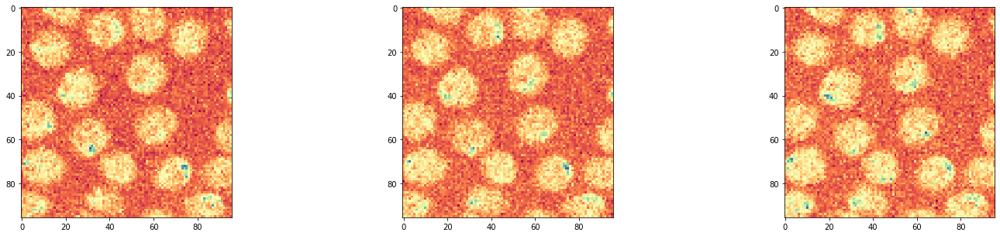

Epoch 12/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.2725 - accuracy: 0.6316 - val_loss: 1.2689 - val_accuracy: 0.5140

Epoch 00012: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


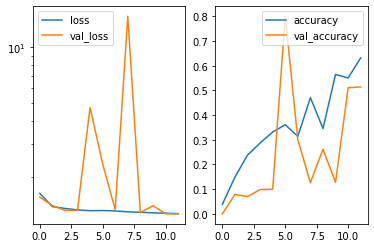

Predicted cell: Totaloff Probability: [[[[9.9999952e-01 4.2808023e-07 3.3408317e-12 5.0106740e-01
    4.9399436e-01 4.9609938e-01 9.9999905e-01 9.9998808e-01
    4.3694049e-01]]]]
True Cell type: Totaloff
x [[[0.5010674]]]
True positional value x 0.5
y [[[0.49399436]]]
True positional value y 0.5
z [[[0.49609938]]]
True positional value z 0.5
h [[[0.99999905]]]
True positional value h 1.0
w [[[0.9999881]]]
True positional value w 1.0
c [[[0.4369405]]]
True positional value c 1.0


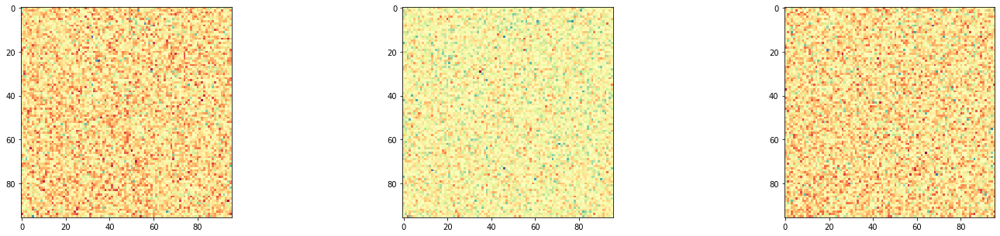

Epoch 13/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2701 - accuracy: 0.5706 - val_loss: 1.3499 - val_accuracy: 0.1526

Epoch 00013: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


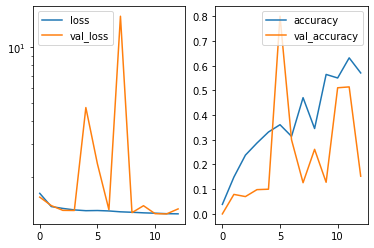

[[9.9994373e-01 5.6210742e-05 4.0818918e-10 4.8484546e-01 4.9673593e-01
  4.9002644e-01 9.9999917e-01 9.9999022e-01 4.3220931e-01]]
True Cell type: Totaloff
x [[[0.48484546]]]
True positional value x 0.5
y [[[0.49673593]]]
True positional value y 0.5
z [[[0.49002644]]]
True positional value z 0.5
h [[[0.99999917]]]
True positional value h 1.0
w [[[0.9999902]]]
True positional value w 1.0
c [[[0.4322093]]]
True positional value c 1.0


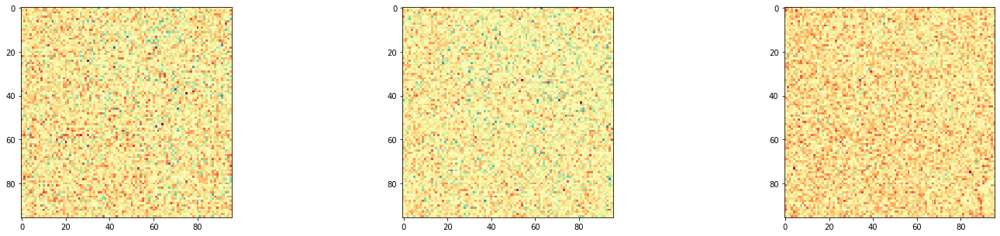

Epoch 14/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2671 - accuracy: 0.4872 - val_loss: 1.2616 - val_accuracy: 0.2035

Epoch 00014: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


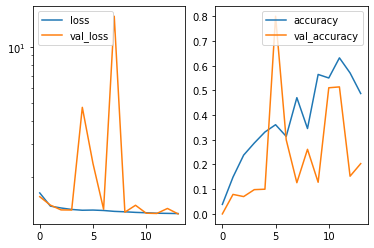

[[9.9930573e-01 6.9428957e-04 8.1114664e-11 4.9389970e-01 5.0800478e-01
  5.0450087e-01 9.9999893e-01 9.9998820e-01 4.1475463e-01]]
True Cell type: Totaloff
x [[[0.4938997]]]
True positional value x 0.5
y [[[0.5080048]]]
True positional value y 0.5
z [[[0.50450087]]]
True positional value z 0.5
h [[[0.9999989]]]
True positional value h 1.0
w [[[0.9999882]]]
True positional value w 1.0
c [[[0.41475463]]]
True positional value c 1.0


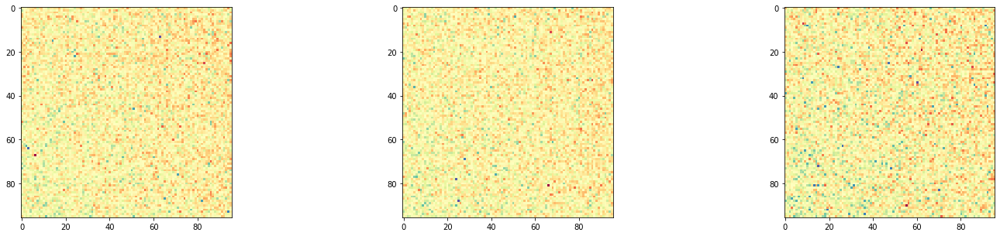

Epoch 15/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2570 - accuracy: 0.6137 - val_loss: 1.2548 - val_accuracy: 0.5018

Epoch 00015: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


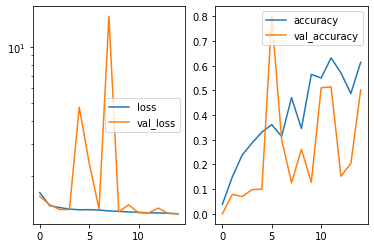

[[9.9999607e-01 3.9447955e-06 8.5468811e-12 5.0712872e-01 5.0240123e-01
  4.9733913e-01 9.9999797e-01 9.9998081e-01 4.4126201e-01]]
True Cell type: Totaloff
x [[[0.5071287]]]
True positional value x 0.5
y [[[0.50240123]]]
True positional value y 0.5
z [[[0.49733913]]]
True positional value z 0.5
h [[[0.999998]]]
True positional value h 1.0
w [[[0.9999808]]]
True positional value w 1.0
c [[[0.441262]]]
True positional value c 1.0


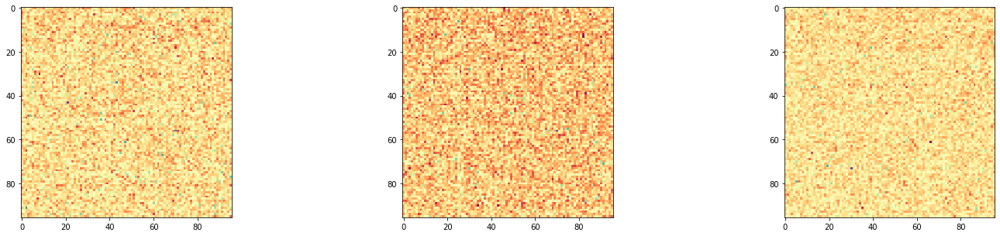

Epoch 16/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.2536 - accuracy: 0.6415 - val_loss: 1.5121 - val_accuracy: 0.1298

Epoch 00016: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


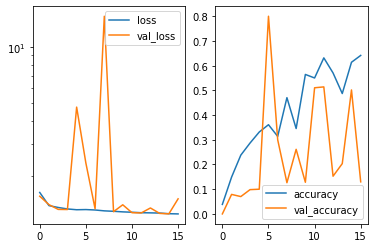

[[9.2901123e-01 7.0988223e-02 5.5892076e-07 4.9980542e-01 5.0047982e-01
  4.9050716e-01 9.9999928e-01 9.9999118e-01 4.7074226e-01]]
True Cell type: Totaloff
x [[[0.49980542]]]
True positional value x 0.5
y [[[0.5004798]]]
True positional value y 0.5
z [[[0.49050716]]]
True positional value z 0.5
h [[[0.9999993]]]
True positional value h 1.0
w [[[0.9999912]]]
True positional value w 1.0
c [[[0.47074226]]]
True positional value c 1.0


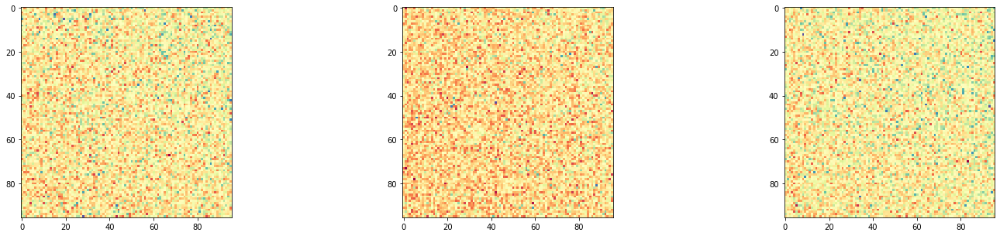

Epoch 17/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2460 - accuracy: 0.6642 - val_loss: 1.2410 - val_accuracy: 0.6702

Epoch 00017: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


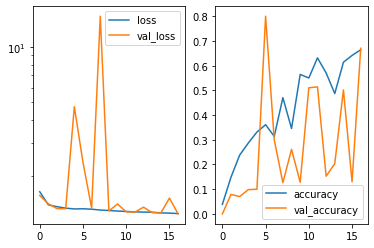

[[1.8022864e-11 1.5238425e-13 1.0000000e+00 5.0784945e-01 4.8097020e-01
  4.9886498e-01 9.9987674e-01 9.9947995e-01 4.9379760e-01]]
True Cell type: BestNuclei
x [[[0.50784945]]]
True positional value x 0.5
y [[[0.4809702]]]
True positional value y 0.5
z [[[0.49886498]]]
True positional value z 0.5
h [[[0.99987674]]]
True positional value h 1.0
w [[[0.99947995]]]
True positional value w 1.0
c [[[0.4937976]]]
True positional value c 1.0


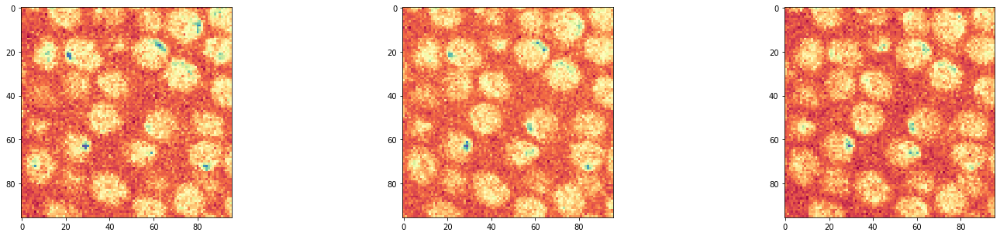

Epoch 18/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2392 - accuracy: 0.7045 - val_loss: 1.2355 - val_accuracy: 0.4860

Epoch 00018: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


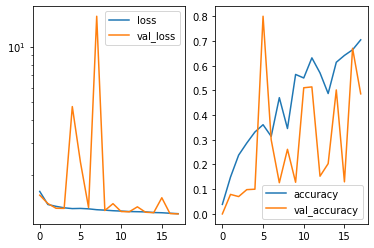

[[6.8354822e-04 9.9914253e-01 1.7383923e-04 4.9205491e-01 5.0625688e-01
  5.0714064e-01 9.9992549e-01 9.9958938e-01 4.9895138e-01]]
True Cell type: BestCad
x [[[0.4920549]]]
True positional value x 0.5
y [[[0.5062569]]]
True positional value y 0.5
z [[[0.50714064]]]
True positional value z 0.5
h [[[0.9999255]]]
True positional value h 1.0
w [[[0.9995894]]]
True positional value w 1.0
c [[[0.49895138]]]
True positional value c 1.0


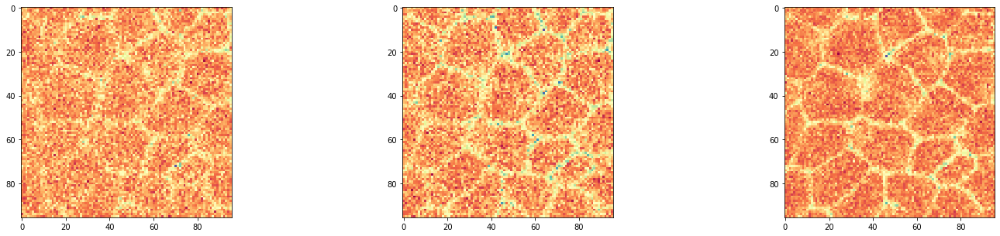

Epoch 19/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.2349 - accuracy: 0.6930 - val_loss: 1.2356 - val_accuracy: 0.8404

Epoch 00019: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


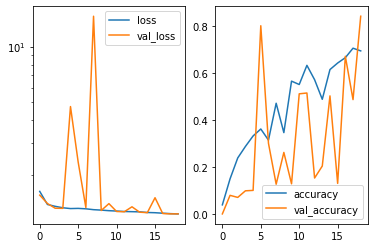

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 2.8745236e-08 3.5025438e-13 4.9389181e-01
    4.9971667e-01 4.9902907e-01 9.9999583e-01 9.9996364e-01
    4.2669132e-01]]]]
True Cell type: Totaloff
x [[[0.4938918]]]
True positional value x 0.5
y [[[0.49971667]]]
True positional value y 0.5
z [[[0.49902907]]]
True positional value z 0.5
h [[[0.9999958]]]
True positional value h 1.0
w [[[0.99996364]]]
True positional value w 1.0
c [[[0.42669132]]]
True positional value c 1.0


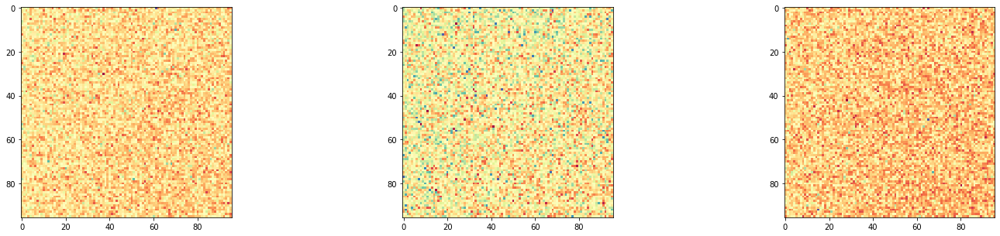

Epoch 20/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2270 - accuracy: 0.7734 - val_loss: 1.2242 - val_accuracy: 0.8263

Epoch 00020: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


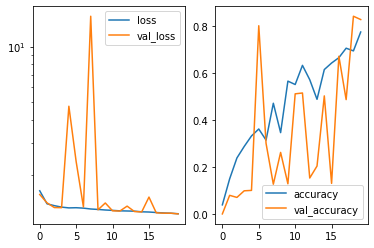

[[3.4473066e-10 4.3980961e-09 1.0000000e+00 4.9643835e-01 4.8759586e-01
  5.0835705e-01 9.9997902e-01 9.9987853e-01 4.6000355e-01]]
True Cell type: BestNuclei
x [[[0.49643835]]]
True positional value x 0.5
y [[[0.48759586]]]
True positional value y 0.5
z [[[0.50835705]]]
True positional value z 0.5
h [[[0.999979]]]
True positional value h 1.0
w [[[0.9998785]]]
True positional value w 1.0
c [[[0.46000355]]]
True positional value c 1.0


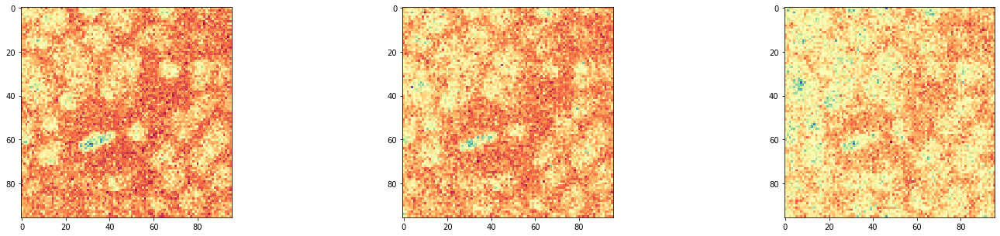

Epoch 21/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.2344 - accuracy: 0.6823 - val_loss: 1.2456 - val_accuracy: 0.2333

Epoch 00021: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


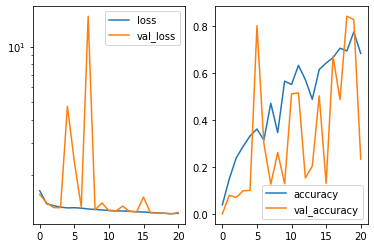

[[9.9956542e-01 4.3460506e-04 2.7052669e-09 4.9350774e-01 4.9401325e-01
  4.9694297e-01 9.9998188e-01 9.9989069e-01 4.8304534e-01]]
True Cell type: Totaloff
x [[[0.49350774]]]
True positional value x 0.5
y [[[0.49401325]]]
True positional value y 0.5
z [[[0.49694297]]]
True positional value z 0.5
h [[[0.9999819]]]
True positional value h 1.0
w [[[0.9998907]]]
True positional value w 1.0
c [[[0.48304534]]]
True positional value c 1.0


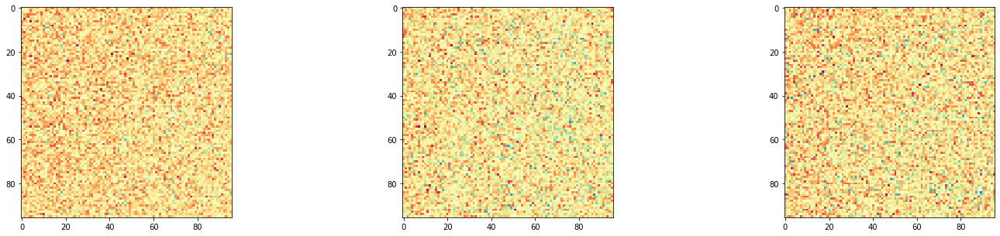

Epoch 22/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.2200 - accuracy: 0.6809 - val_loss: 1.3136 - val_accuracy: 0.1649

Epoch 00022: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


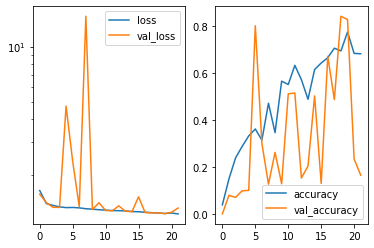

[[3.7062529e-09 2.1587994e-07 9.9999976e-01 5.1574945e-01 5.0002271e-01
  5.1743275e-01 9.9887496e-01 9.9681717e-01 4.6562088e-01]]
True Cell type: BestNuclei
x [[[0.51574945]]]
True positional value x 0.5
y [[[0.5000227]]]
True positional value y 0.5
z [[[0.51743275]]]
True positional value z 0.5
h [[[0.99887496]]]
True positional value h 1.0
w [[[0.9968172]]]
True positional value w 1.0
c [[[0.46562088]]]
True positional value c 1.0


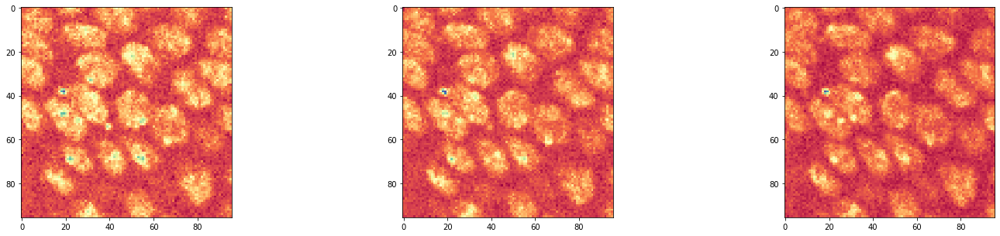

Epoch 23/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.2141 - accuracy: 0.6941 - val_loss: 1.2178 - val_accuracy: 0.5667

Epoch 00023: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


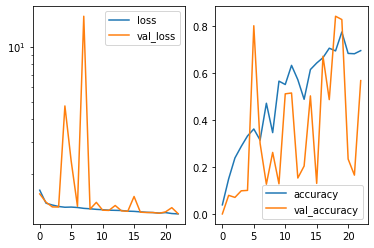

[[9.9999142e-01 8.6028185e-06 2.0636277e-11 5.0380707e-01 4.9730805e-01
  4.9366057e-01 9.9999666e-01 9.9997151e-01 4.5468298e-01]]
True Cell type: Totaloff
x [[[0.50380707]]]
True positional value x 0.5
y [[[0.49730805]]]
True positional value y 0.5
z [[[0.49366057]]]
True positional value z 0.5
h [[[0.99999666]]]
True positional value h 1.0
w [[[0.9999715]]]
True positional value w 1.0
c [[[0.45468298]]]
True positional value c 1.0


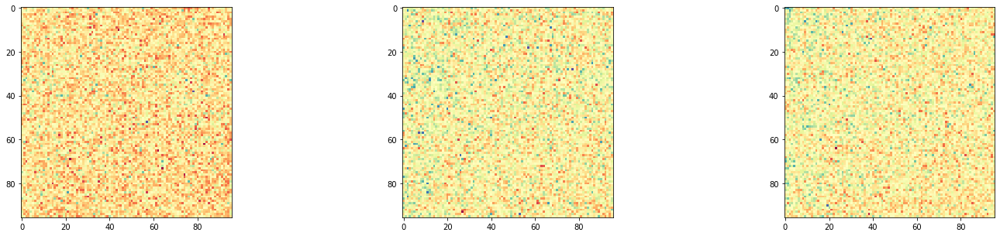

Epoch 24/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.2070 - accuracy: 0.7475 - val_loss: 1.2086 - val_accuracy: 0.7035

Epoch 00024: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


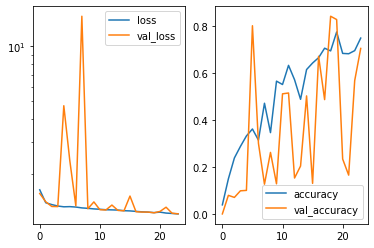

Predicted cell: Totaloff Probability: [[[[9.9999988e-01 1.7332157e-07 1.7751863e-12 4.8802051e-01
    4.9266425e-01 4.9587750e-01 9.9999642e-01 9.9996603e-01
    4.6534002e-01]]]]
True Cell type: Totaloff
x [[[0.4880205]]]
True positional value x 0.5
y [[[0.49266425]]]
True positional value y 0.5
z [[[0.4958775]]]
True positional value z 0.5
h [[[0.9999964]]]
True positional value h 1.0
w [[[0.999966]]]
True positional value w 1.0
c [[[0.46534002]]]
True positional value c 1.0


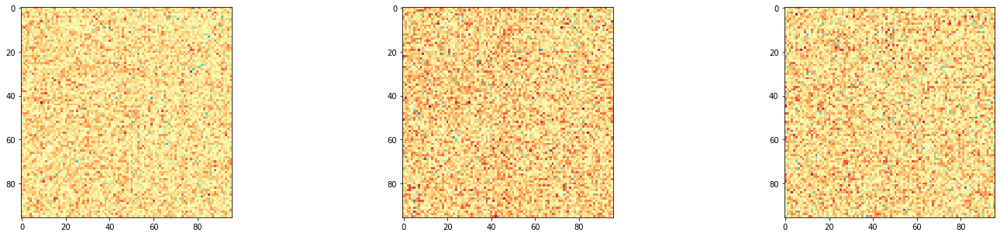

Epoch 25/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.2010 - accuracy: 0.7930 - val_loss: 1.2030 - val_accuracy: 0.7877

Epoch 00025: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


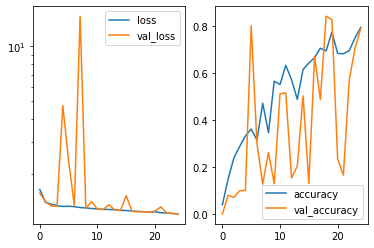

Predicted cell: Totaloff Probability: [[[[9.9999917e-01 8.3503255e-07 6.7327593e-12 4.9184355e-01
    5.0504619e-01 5.0375432e-01 9.9999809e-01 9.9998188e-01
    4.6516350e-01]]]]
True Cell type: Totaloff
x [[[0.49184355]]]
True positional value x 0.5
y [[[0.5050462]]]
True positional value y 0.5
z [[[0.5037543]]]
True positional value z 0.5
h [[[0.9999981]]]
True positional value h 1.0
w [[[0.9999819]]]
True positional value w 1.0
c [[[0.4651635]]]
True positional value c 1.0


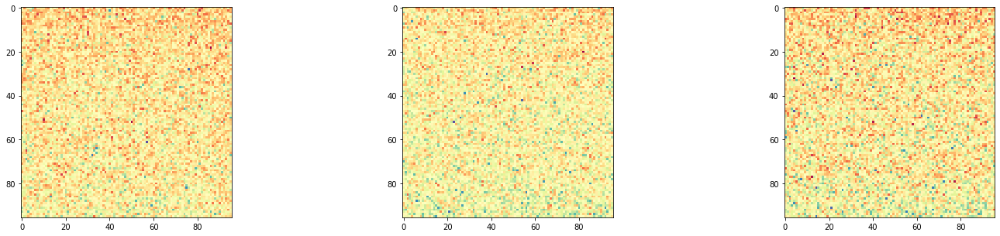

Epoch 26/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.2003 - accuracy: 0.7238 - val_loss: 1.1964 - val_accuracy: 0.6421

Epoch 00026: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


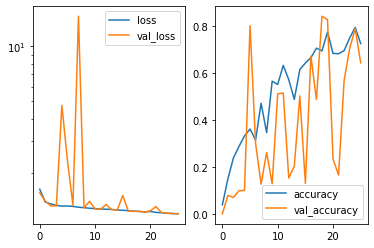

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 4.6261128e-08 1.3829624e-12 4.9491295e-01
    4.8589084e-01 5.0455207e-01 9.9999607e-01 9.9996758e-01
    4.4290358e-01]]]]
True Cell type: Totaloff
x [[[0.49491295]]]
True positional value x 0.5
y [[[0.48589084]]]
True positional value y 0.5
z [[[0.50455207]]]
True positional value z 0.5
h [[[0.99999607]]]
True positional value h 1.0
w [[[0.9999676]]]
True positional value w 1.0
c [[[0.44290358]]]
True positional value c 1.0


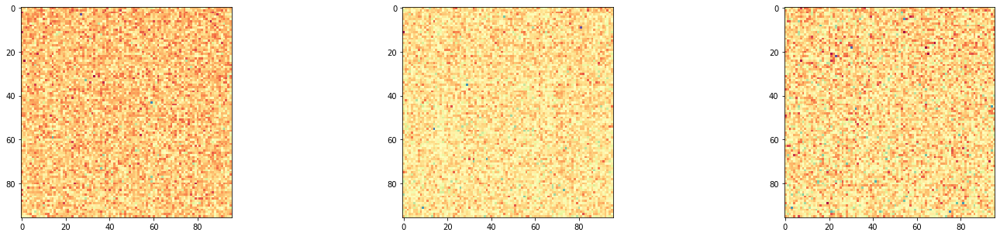

Epoch 27/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1913 - accuracy: 0.8039 - val_loss: 1.1892 - val_accuracy: 0.7702

Epoch 00027: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


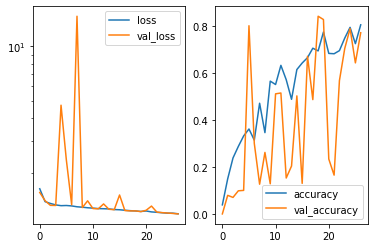

Predicted cell: Totaloff Probability: [[[[9.9999988e-01 1.2269540e-07 7.8248293e-12 4.9420244e-01
    5.0056684e-01 5.0450808e-01 9.9999630e-01 9.9996781e-01
    4.7681400e-01]]]]
True Cell type: Totaloff
x [[[0.49420244]]]
True positional value x 0.5
y [[[0.50056684]]]
True positional value y 0.5
z [[[0.5045081]]]
True positional value z 0.5
h [[[0.9999963]]]
True positional value h 1.0
w [[[0.9999678]]]
True positional value w 1.0
c [[[0.476814]]]
True positional value c 1.0


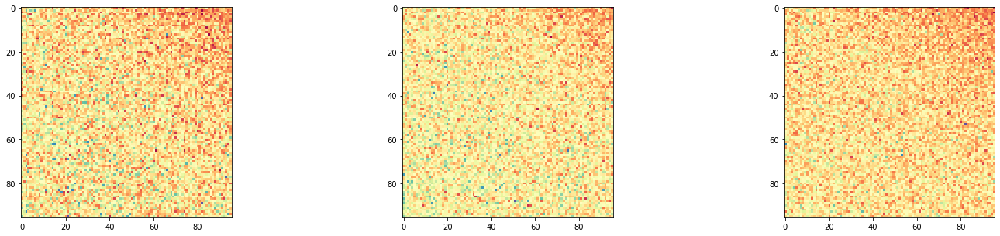

Epoch 28/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1857 - accuracy: 0.8330 - val_loss: 1.1856 - val_accuracy: 0.8193

Epoch 00028: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


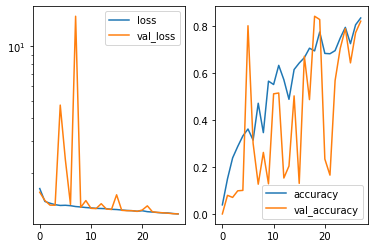

Predicted cell: Totaloff Probability: [[[[9.99999881e-01 1.08907344e-07 4.45711046e-12 4.97378230e-01
    5.02656221e-01 5.07298529e-01 9.99996662e-01 9.99974608e-01
    4.34524924e-01]]]]
True Cell type: Totaloff
x [[[0.49737823]]]
True positional value x 0.5
y [[[0.5026562]]]
True positional value y 0.5
z [[[0.5072985]]]
True positional value z 0.5
h [[[0.99999666]]]
True positional value h 1.0
w [[[0.9999746]]]
True positional value w 1.0
c [[[0.43452492]]]
True positional value c 1.0


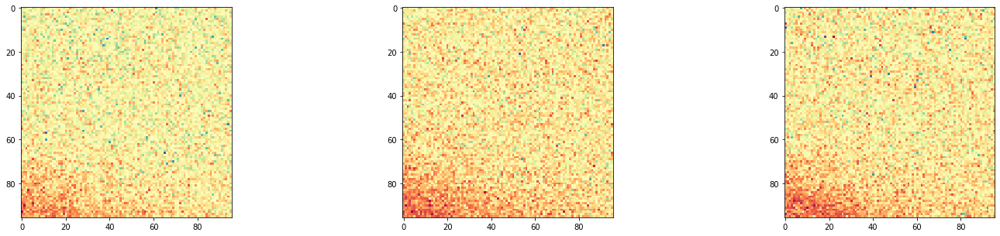

Epoch 29/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.1809 - accuracy: 0.8442 - val_loss: 1.1813 - val_accuracy: 0.6193

Epoch 00029: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


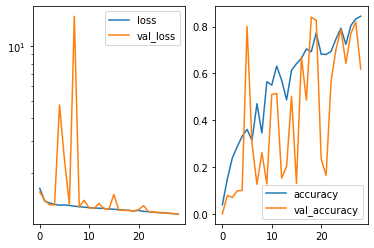

[[9.99987364e-01 1.26805835e-05 4.80632062e-11 4.94983613e-01
  4.94385123e-01 4.90336955e-01 9.99991894e-01 9.99939203e-01
  4.64436531e-01]]
True Cell type: Totaloff
x [[[0.4949836]]]
True positional value x 0.5
y [[[0.49438512]]]
True positional value y 0.5
z [[[0.49033695]]]
True positional value z 0.5
h [[[0.9999919]]]
True positional value h 1.0
w [[[0.9999392]]]
True positional value w 1.0
c [[[0.46443653]]]
True positional value c 1.0


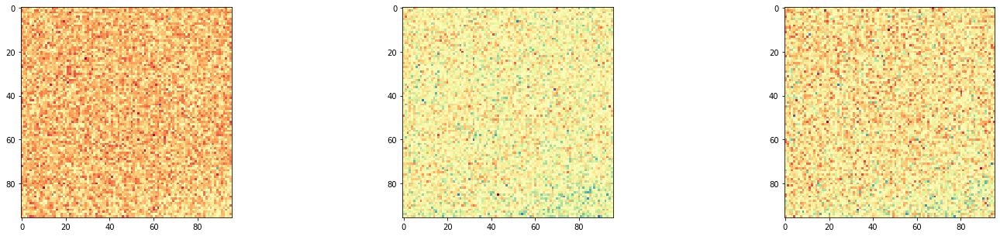

Epoch 30/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.1777 - accuracy: 0.8330 - val_loss: 1.1784 - val_accuracy: 0.8105

Epoch 00030: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


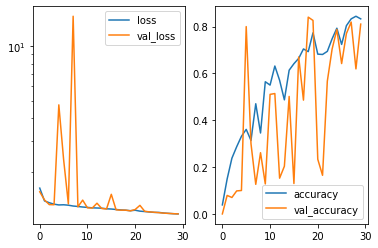

Predicted cell: Totaloff Probability: [[[[9.9999917e-01 8.4127123e-07 4.5457436e-12 5.0373089e-01
    4.9231082e-01 5.0046754e-01 9.9999571e-01 9.9996710e-01
    4.7616661e-01]]]]
True Cell type: Totaloff
x [[[0.5037309]]]
True positional value x 0.5
y [[[0.49231082]]]
True positional value y 0.5
z [[[0.50046754]]]
True positional value z 0.5
h [[[0.9999957]]]
True positional value h 1.0
w [[[0.9999671]]]
True positional value w 1.0
c [[[0.4761666]]]
True positional value c 1.0


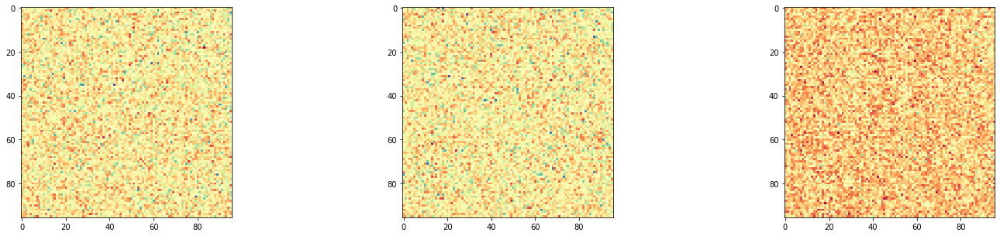

Epoch 31/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.1716 - accuracy: 0.8178 - val_loss: 1.1702 - val_accuracy: 0.7702

Epoch 00031: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


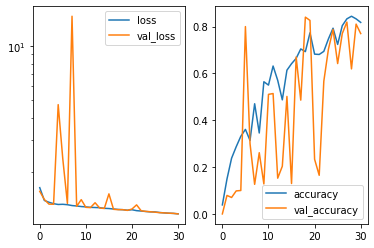

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 7.4838219e-10 2.5706849e-14 5.0361955e-01
    5.1095504e-01 5.0817943e-01 9.9999917e-01 9.9999142e-01
    4.4443813e-01]]]]
True Cell type: Totaloff
x [[[0.50361955]]]
True positional value x 0.5
y [[[0.51095504]]]
True positional value y 0.5
z [[[0.5081794]]]
True positional value z 0.5
h [[[0.99999917]]]
True positional value h 1.0
w [[[0.9999914]]]
True positional value w 1.0
c [[[0.44443813]]]
True positional value c 1.0


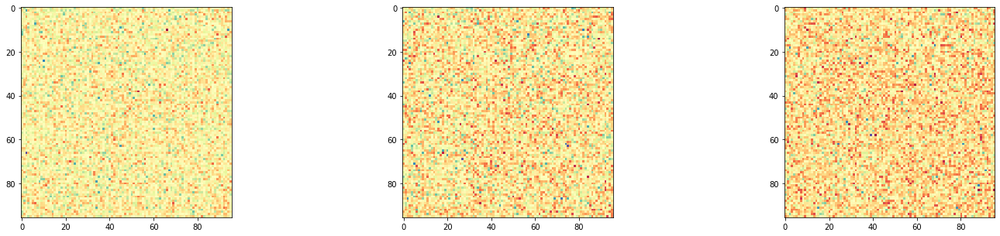

Epoch 32/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1683 - accuracy: 0.8137 - val_loss: 1.1649 - val_accuracy: 0.7456

Epoch 00032: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


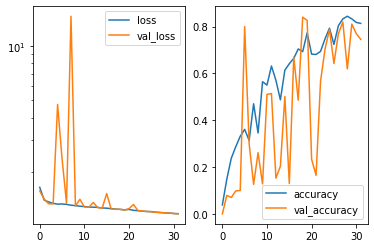

Predicted cell: Totaloff Probability: [[[[9.9999952e-01 5.2535387e-07 4.3171198e-08 4.9438524e-01
    4.9556851e-01 5.0828320e-01 9.9995327e-01 9.9975222e-01
    5.0159854e-01]]]]
True Cell type: Totaloff
x [[[0.49438524]]]
True positional value x 0.5
y [[[0.4955685]]]
True positional value y 0.5
z [[[0.5082832]]]
True positional value z 0.5
h [[[0.99995327]]]
True positional value h 1.0
w [[[0.9997522]]]
True positional value w 1.0
c [[[0.50159854]]]
True positional value c 1.0


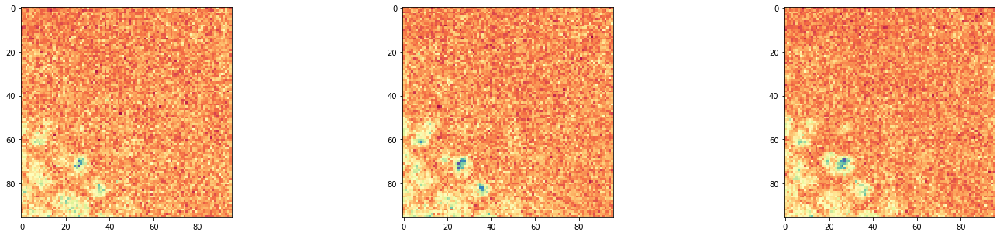

Epoch 33/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1616 - accuracy: 0.8370 - val_loss: 1.2150 - val_accuracy: 0.2333

Epoch 00033: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


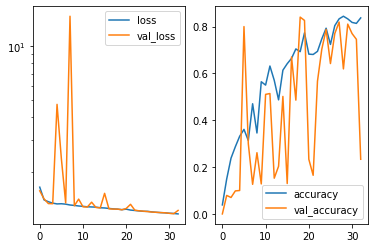

[[9.9964929e-01 3.5069510e-04 7.1512141e-10 5.0399929e-01 5.0145000e-01
  5.0606948e-01 9.9999559e-01 9.9996686e-01 4.3350688e-01]]
True Cell type: Totaloff
x [[[0.5039993]]]
True positional value x 0.5
y [[[0.50145]]]
True positional value y 0.5
z [[[0.5060695]]]
True positional value z 0.5
h [[[0.9999956]]]
True positional value h 1.0
w [[[0.99996686]]]
True positional value w 1.0
c [[[0.43350688]]]
True positional value c 1.0


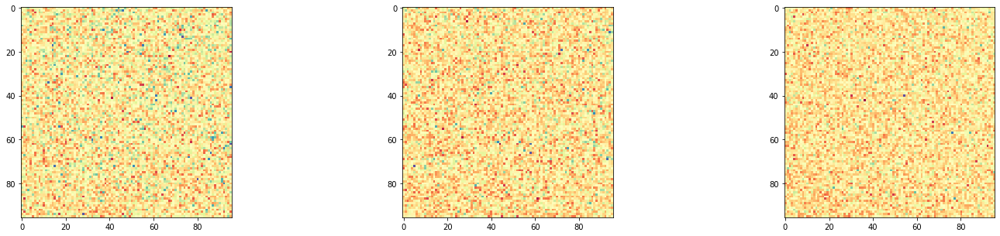

Epoch 34/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1567 - accuracy: 0.8784 - val_loss: 1.1561 - val_accuracy: 0.8684

Epoch 00034: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


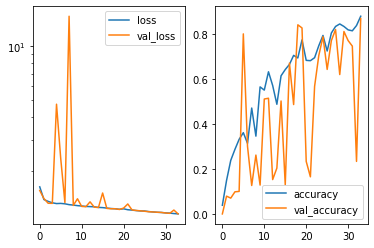

[[9.9494966e-05 9.9989617e-01 4.3235582e-06 4.9208614e-01 5.0102556e-01
  4.9986222e-01 9.9991620e-01 9.9957222e-01 4.9473944e-01]]
True Cell type: BestCad
x [[[0.49208614]]]
True positional value x 0.5
y [[[0.50102556]]]
True positional value y 0.5
z [[[0.49986222]]]
True positional value z 0.5
h [[[0.9999162]]]
True positional value h 1.0
w [[[0.9995722]]]
True positional value w 1.0
c [[[0.49473944]]]
True positional value c 1.0


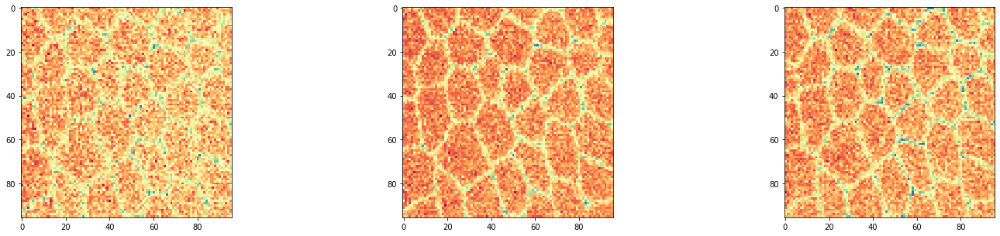

Epoch 35/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.1517 - accuracy: 0.8704 - val_loss: 1.1501 - val_accuracy: 0.8702

Epoch 00035: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


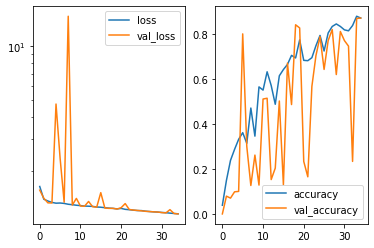

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 2.8620065e-08 7.5340526e-13 4.9150428e-01
    5.0094461e-01 4.9057508e-01 9.9999726e-01 9.9997544e-01
    4.5825070e-01]]]]
True Cell type: Totaloff
x [[[0.49150428]]]
True positional value x 0.5
y [[[0.5009446]]]
True positional value y 0.5
z [[[0.49057508]]]
True positional value z 0.5
h [[[0.99999726]]]
True positional value h 1.0
w [[[0.99997544]]]
True positional value w 1.0
c [[[0.4582507]]]
True positional value c 1.0


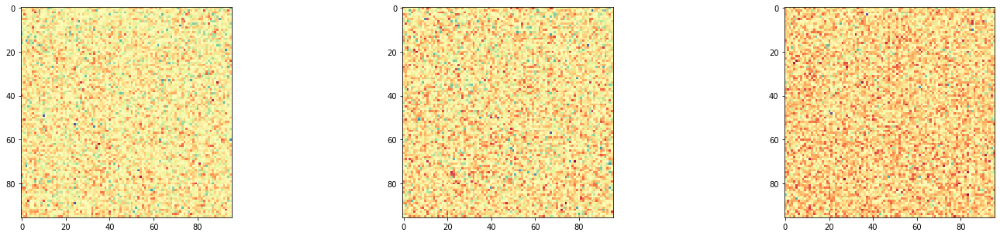

Epoch 36/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1470 - accuracy: 0.8980 - val_loss: 1.1463 - val_accuracy: 0.8877

Epoch 00036: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


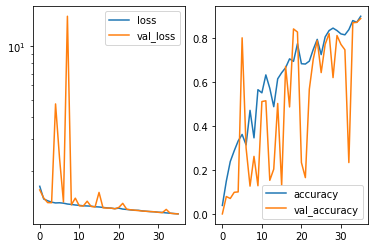

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 2.9836773e-08 1.0625122e-12 4.9424180e-01
    5.0076479e-01 4.9292201e-01 9.9999785e-01 9.9998152e-01
    4.5078012e-01]]]]
True Cell type: Totaloff
x [[[0.4942418]]]
True positional value x 0.5
y [[[0.5007648]]]
True positional value y 0.5
z [[[0.492922]]]
True positional value z 0.5
h [[[0.99999785]]]
True positional value h 1.0
w [[[0.9999815]]]
True positional value w 1.0
c [[[0.45078012]]]
True positional value c 1.0


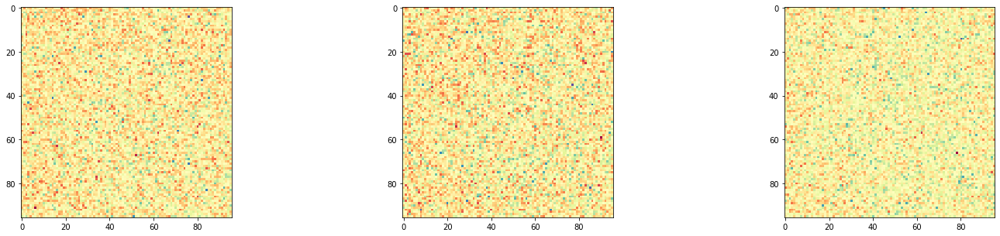

Epoch 37/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1422 - accuracy: 0.8940 - val_loss: 1.1415 - val_accuracy: 0.8877

Epoch 00037: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


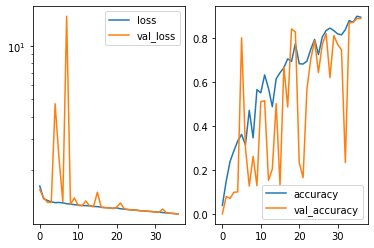

Predicted cell: Totaloff Probability: [[[[9.9999988e-01 1.0860345e-07 1.8846836e-12 5.0310361e-01
    5.0254130e-01 4.9813807e-01 9.9999154e-01 9.9994242e-01
    4.6896461e-01]]]]
True Cell type: Totaloff
x [[[0.5031036]]]
True positional value x 0.5
y [[[0.5025413]]]
True positional value y 0.5
z [[[0.49813807]]]
True positional value z 0.5
h [[[0.99999154]]]
True positional value h 1.0
w [[[0.9999424]]]
True positional value w 1.0
c [[[0.4689646]]]
True positional value c 1.0


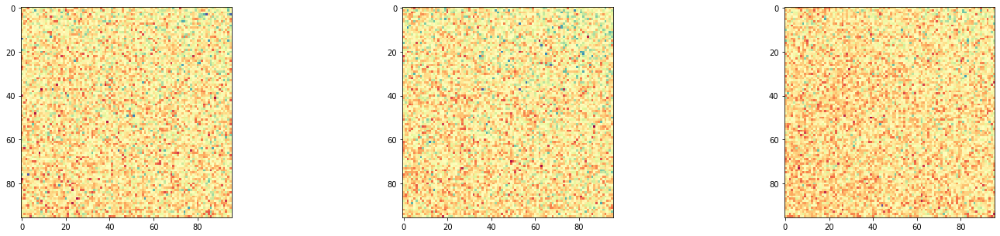

Epoch 38/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.1375 - accuracy: 0.9047 - val_loss: 1.1364 - val_accuracy: 0.8895

Epoch 00038: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


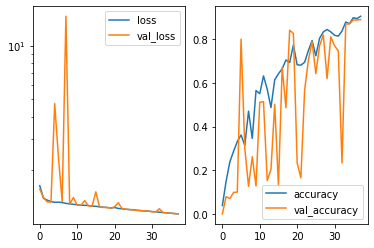

[[4.6153189e-11 3.8666168e-13 1.0000000e+00 4.9889240e-01 4.8370448e-01
  5.0338203e-01 9.9993312e-01 9.9965620e-01 4.9089488e-01]]
True Cell type: BestNuclei
x [[[0.4988924]]]
True positional value x 0.5
y [[[0.48370448]]]
True positional value y 0.5
z [[[0.503382]]]
True positional value z 0.5
h [[[0.9999331]]]
True positional value h 1.0
w [[[0.9996562]]]
True positional value w 1.0
c [[[0.49089488]]]
True positional value c 1.0


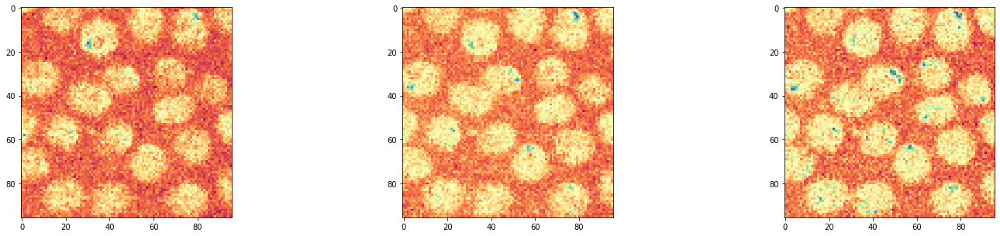

Epoch 39/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1328 - accuracy: 0.8785 - val_loss: 1.1313 - val_accuracy: 0.8982

Epoch 00039: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


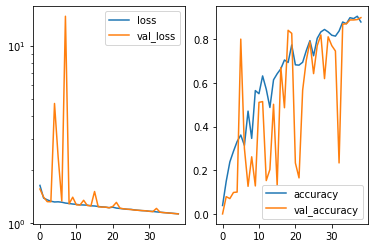

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 4.4618891e-09 5.0970756e-13 4.9190354e-01
    4.9780253e-01 5.0719154e-01 9.9999654e-01 9.9997103e-01
    4.4697201e-01]]]]
True Cell type: Totaloff
x [[[0.49190354]]]
True positional value x 0.5
y [[[0.49780253]]]
True positional value y 0.5
z [[[0.50719154]]]
True positional value z 0.5
h [[[0.99999654]]]
True positional value h 1.0
w [[[0.99997103]]]
True positional value w 1.0
c [[[0.446972]]]
True positional value c 1.0


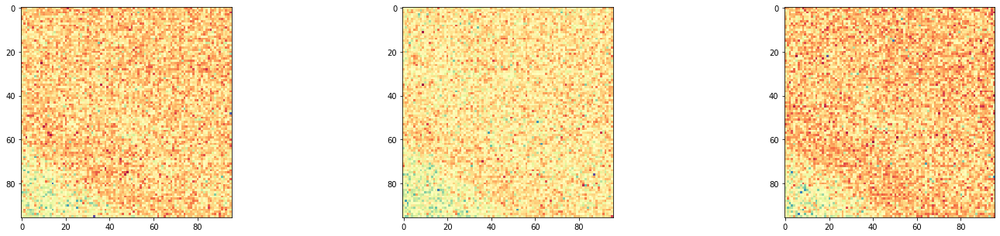

Epoch 40/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1282 - accuracy: 0.8981 - val_loss: 1.1265 - val_accuracy: 0.8877

Epoch 00040: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


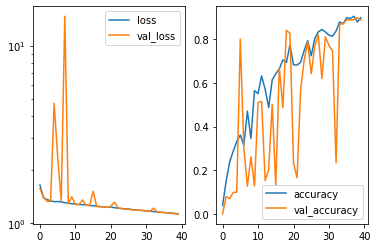

Predicted cell: Totaloff Probability: [[[[9.9999940e-01 5.8566445e-07 9.5328198e-12 5.0498003e-01
    5.0631571e-01 4.9720907e-01 9.9999702e-01 9.9998152e-01
    4.0496939e-01]]]]
True Cell type: Totaloff
x [[[0.50498]]]
True positional value x 0.5
y [[[0.5063157]]]
True positional value y 0.5
z [[[0.49720907]]]
True positional value z 0.5
h [[[0.999997]]]
True positional value h 1.0
w [[[0.9999815]]]
True positional value w 1.0
c [[[0.4049694]]]
True positional value c 1.0


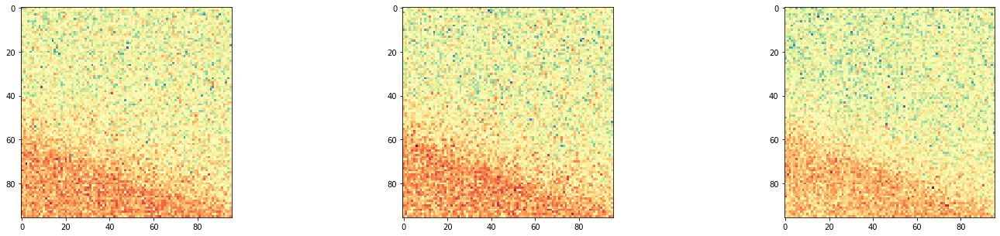

Epoch 41/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1235 - accuracy: 0.9117 - val_loss: 1.1222 - val_accuracy: 0.8614

Epoch 00041: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


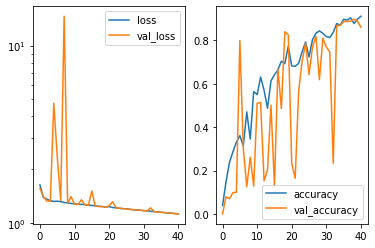

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 6.3224568e-09 6.9364328e-13 5.0682229e-01
    5.0406998e-01 4.8782197e-01 9.9999678e-01 9.9997449e-01
    4.4025064e-01]]]]
True Cell type: Totaloff
x [[[0.5068223]]]
True positional value x 0.5
y [[[0.50407]]]
True positional value y 0.5
z [[[0.48782197]]]
True positional value z 0.5
h [[[0.9999968]]]
True positional value h 1.0
w [[[0.9999745]]]
True positional value w 1.0
c [[[0.44025064]]]
True positional value c 1.0


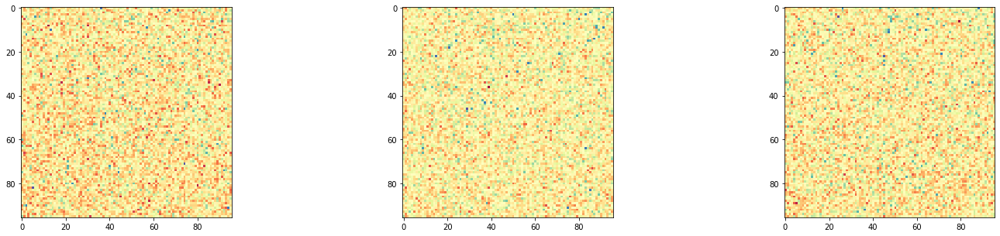

Epoch 42/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1189 - accuracy: 0.9010 - val_loss: 1.1173 - val_accuracy: 0.8895

Epoch 00042: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


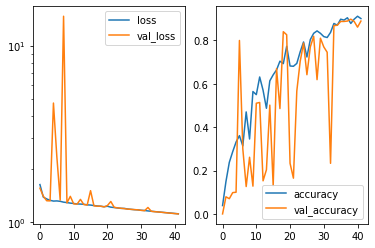

[[6.0560773e-10 5.4167946e-12 1.0000000e+00 5.1051861e-01 5.0120223e-01
  4.9979779e-01 9.9994123e-01 9.9966133e-01 5.3147936e-01]]
True Cell type: BestNuclei
x [[[0.5105186]]]
True positional value x 0.5
y [[[0.5012022]]]
True positional value y 0.5
z [[[0.4997978]]]
True positional value z 0.5
h [[[0.99994123]]]
True positional value h 1.0
w [[[0.9996613]]]
True positional value w 1.0
c [[[0.53147936]]]
True positional value c 1.0


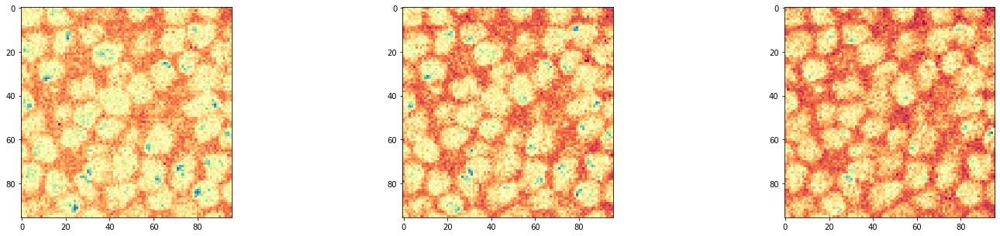

Epoch 43/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.1143 - accuracy: 0.9088 - val_loss: 1.1129 - val_accuracy: 0.8684

Epoch 00043: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


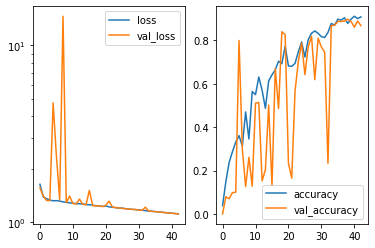

Predicted cell: Totaloff Probability: [[[[9.9999905e-01 9.1745369e-07 5.8933004e-11 4.9828026e-01
    4.9708819e-01 5.0178510e-01 9.9999416e-01 9.9995923e-01
    4.8154742e-01]]]]
True Cell type: Totaloff
x [[[0.49828026]]]
True positional value x 0.5
y [[[0.4970882]]]
True positional value y 0.5
z [[[0.5017851]]]
True positional value z 0.5
h [[[0.99999416]]]
True positional value h 1.0
w [[[0.99995923]]]
True positional value w 1.0
c [[[0.48154742]]]
True positional value c 1.0


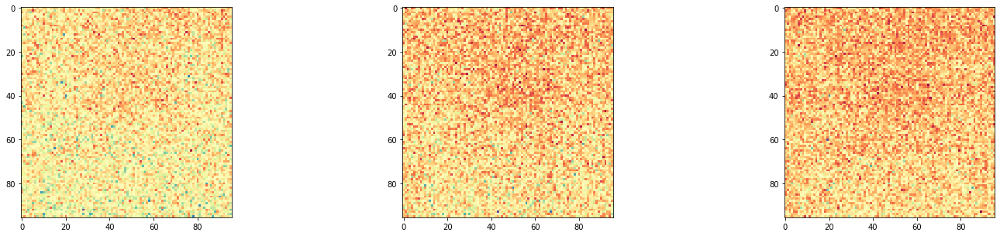

Epoch 44/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.1098 - accuracy: 0.9137 - val_loss: 1.1080 - val_accuracy: 0.8982

Epoch 00044: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


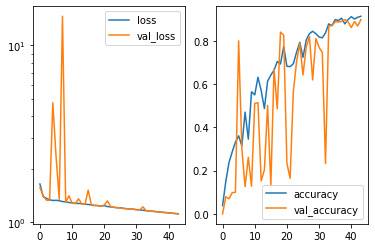

[[1.1508297e-03 9.9883085e-01 1.8334160e-05 5.0670344e-01 5.0449812e-01
  5.0244242e-01 9.9996066e-01 9.9981183e-01 4.6402651e-01]]
True Cell type: BestCad
x [[[0.50670344]]]
True positional value x 0.5
y [[[0.5044981]]]
True positional value y 0.5
z [[[0.5024424]]]
True positional value z 0.5
h [[[0.99996066]]]
True positional value h 1.0
w [[[0.9998118]]]
True positional value w 1.0
c [[[0.4640265]]]
True positional value c 1.0


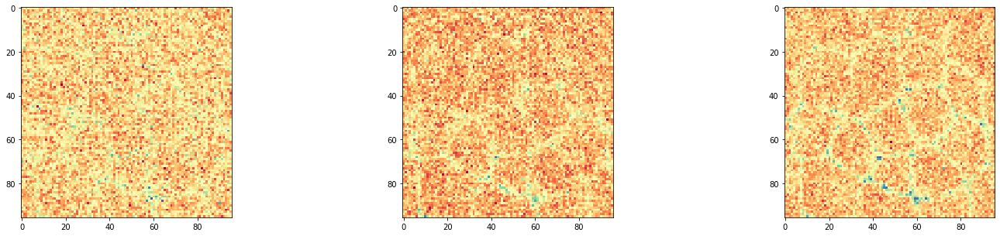

Epoch 45/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.1052 - accuracy: 0.9086 - val_loss: 1.1039 - val_accuracy: 0.8825

Epoch 00045: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


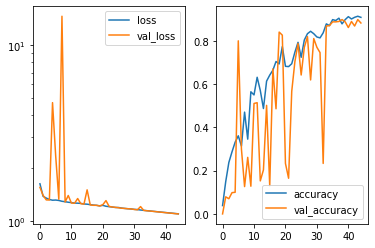

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 8.3467571e-09 1.2256108e-12 5.0545281e-01
    5.1039273e-01 4.8926181e-01 9.9999261e-01 9.9995160e-01
    4.5885342e-01]]]]
True Cell type: Totaloff
x [[[0.5054528]]]
True positional value x 0.5
y [[[0.5103927]]]
True positional value y 0.5
z [[[0.4892618]]]
True positional value z 0.5
h [[[0.9999926]]]
True positional value h 1.0
w [[[0.9999516]]]
True positional value w 1.0
c [[[0.45885342]]]
True positional value c 1.0


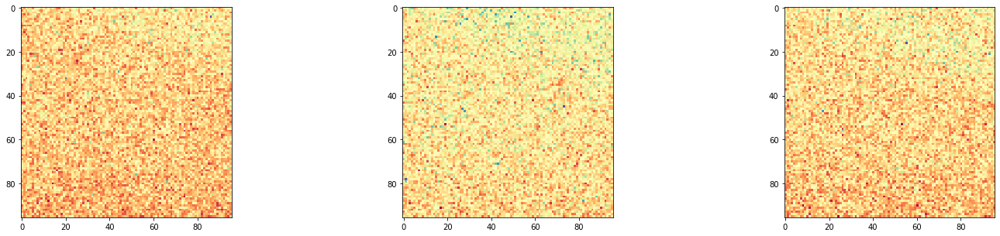

Epoch 46/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.1007 - accuracy: 0.9164 - val_loss: 1.0993 - val_accuracy: 0.9000

Epoch 00046: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


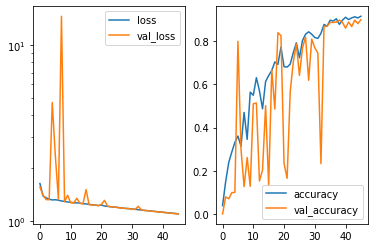

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 4.3778754e-09 5.2590974e-12 5.0094819e-01
    5.0636566e-01 4.9894509e-01 9.9999571e-01 9.9997270e-01
    4.6832368e-01]]]]
True Cell type: Totaloff
x [[[0.5009482]]]
True positional value x 0.5
y [[[0.50636566]]]
True positional value y 0.5
z [[[0.4989451]]]
True positional value z 0.5
h [[[0.9999957]]]
True positional value h 1.0
w [[[0.9999727]]]
True positional value w 1.0
c [[[0.46832368]]]
True positional value c 1.0


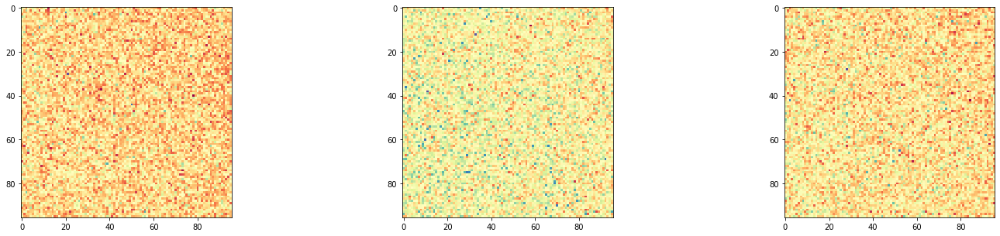

Epoch 47/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.0962 - accuracy: 0.9134 - val_loss: 1.0945 - val_accuracy: 0.9018

Epoch 00047: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


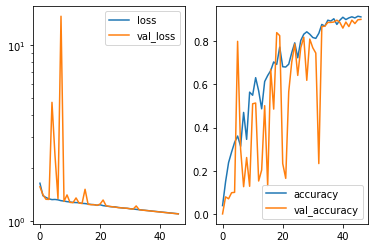

Predicted cell: Totaloff Probability: [[[[9.9999988e-01 8.7900787e-08 8.6094144e-12 5.0040013e-01
    4.9815822e-01 5.0593191e-01 9.9999201e-01 9.9994254e-01
    4.8078370e-01]]]]
True Cell type: Totaloff
x [[[0.5004001]]]
True positional value x 0.5
y [[[0.49815822]]]
True positional value y 0.5
z [[[0.5059319]]]
True positional value z 0.5
h [[[0.999992]]]
True positional value h 1.0
w [[[0.99994254]]]
True positional value w 1.0
c [[[0.4807837]]]
True positional value c 1.0


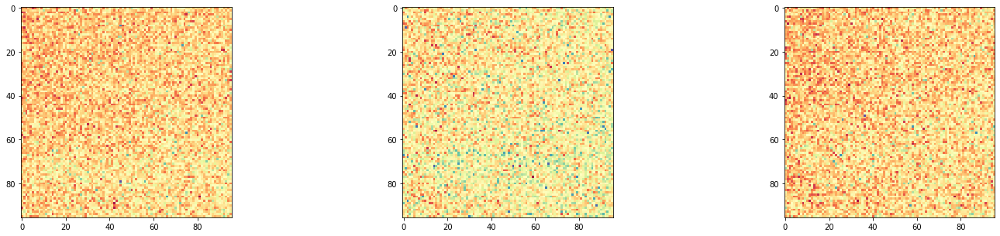

Epoch 48/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.0918 - accuracy: 0.9209 - val_loss: 1.0901 - val_accuracy: 0.9035

Epoch 00048: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


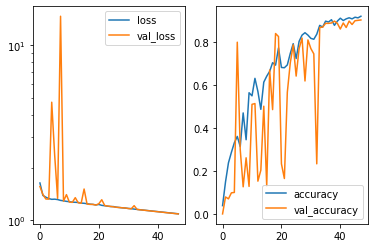

Predicted cell: Totaloff Probability: [[[[9.99999881e-01 1.01348554e-07 3.92080986e-12 5.03199399e-01
    5.02377331e-01 4.98383343e-01 9.99988556e-01 9.99930263e-01
    4.71116126e-01]]]]
True Cell type: Totaloff
x [[[0.5031994]]]
True positional value x 0.5
y [[[0.50237733]]]
True positional value y 0.5
z [[[0.49838334]]]
True positional value z 0.5
h [[[0.99998856]]]
True positional value h 1.0
w [[[0.99993026]]]
True positional value w 1.0
c [[[0.47111613]]]
True positional value c 1.0


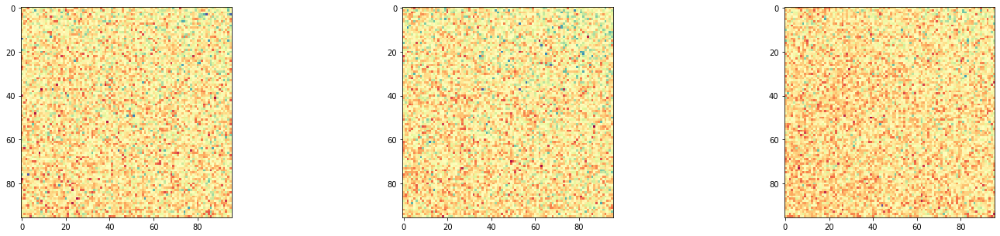

Epoch 49/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.0873 - accuracy: 0.9247 - val_loss: 1.0870 - val_accuracy: 0.7930

Epoch 00049: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


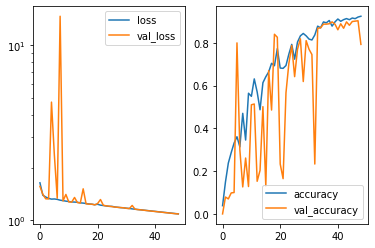

[[9.9984837e-01 1.5163388e-04 2.4271714e-09 4.9311176e-01 5.0454783e-01
  5.0065553e-01 9.9999750e-01 9.9998069e-01 4.6615565e-01]]
True Cell type: Totaloff
x [[[0.49311176]]]
True positional value x 0.5
y [[[0.50454783]]]
True positional value y 0.5
z [[[0.50065553]]]
True positional value z 0.5
h [[[0.9999975]]]
True positional value h 1.0
w [[[0.9999807]]]
True positional value w 1.0
c [[[0.46615565]]]
True positional value c 1.0


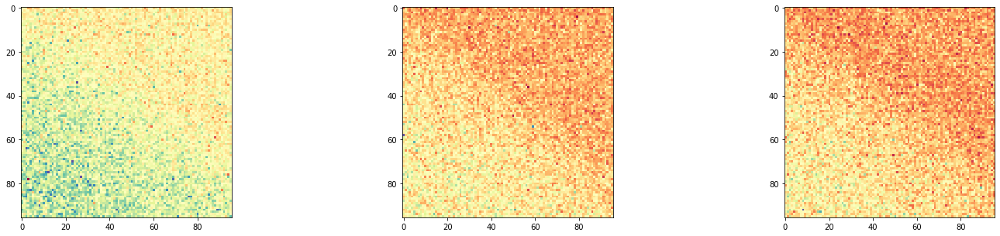

Epoch 50/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.0829 - accuracy: 0.9235 - val_loss: 1.0811 - val_accuracy: 0.9421

Epoch 00050: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


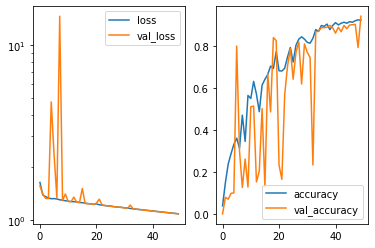

[[3.7254925e-11 2.8466115e-11 1.0000000e+00 5.0432152e-01 4.9171692e-01
  4.9347830e-01 9.9990118e-01 9.9953270e-01 5.1238185e-01]]
True Cell type: BestNuclei
x [[[0.5043215]]]
True positional value x 0.5
y [[[0.49171692]]]
True positional value y 0.5
z [[[0.4934783]]]
True positional value z 0.5
h [[[0.9999012]]]
True positional value h 1.0
w [[[0.9995327]]]
True positional value w 1.0
c [[[0.51238185]]]
True positional value c 1.0


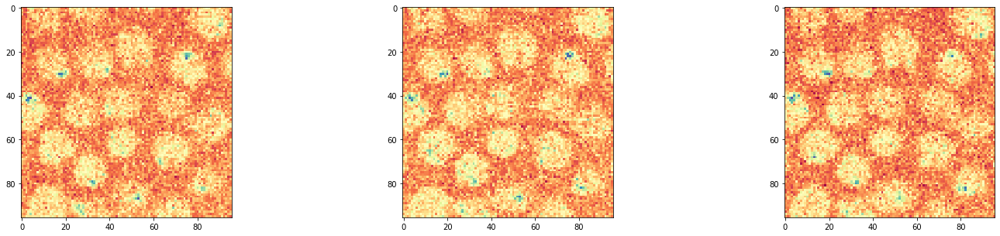

Epoch 51/250
10819/10819 [==============================] - 168s 16ms/step - loss: 1.0785 - accuracy: 0.9416 - val_loss: 1.0770 - val_accuracy: 0.9263

Epoch 00051: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


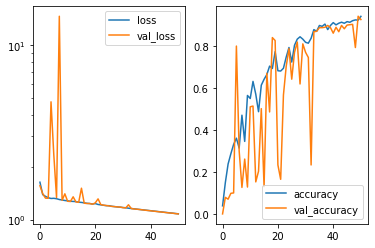

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 3.2517125e-08 4.1362668e-12 5.0427938e-01
    4.9892098e-01 4.9254924e-01 9.9999297e-01 9.9995434e-01
    4.7514978e-01]]]]
True Cell type: Totaloff
x [[[0.5042794]]]
True positional value x 0.5
y [[[0.49892098]]]
True positional value y 0.5
z [[[0.49254924]]]
True positional value z 0.5
h [[[0.99999297]]]
True positional value h 1.0
w [[[0.99995434]]]
True positional value w 1.0
c [[[0.47514978]]]
True positional value c 1.0


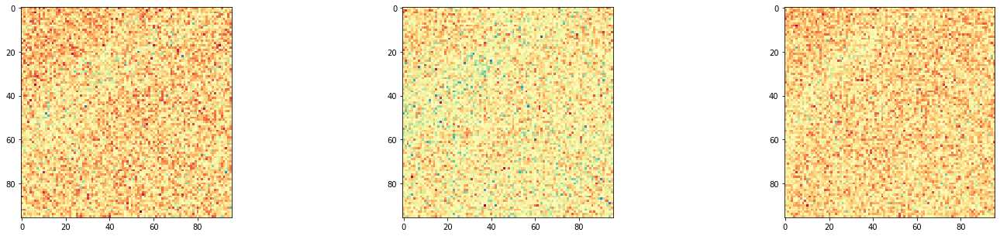

Epoch 52/250
10819/10819 [==============================] - 168s 16ms/step - loss: 1.0741 - accuracy: 0.9391 - val_loss: 1.0724 - val_accuracy: 0.9316

Epoch 00052: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


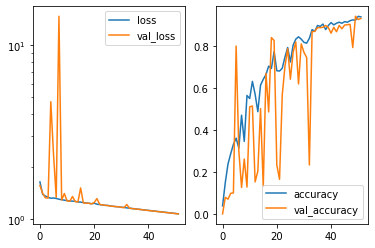

[[6.7611301e-15 3.0756846e-15 1.0000000e+00 4.9410695e-01 4.9950346e-01
  5.1270372e-01 9.9855131e-01 9.9609679e-01 5.1955003e-01]]
True Cell type: BestNuclei
x [[[0.49410695]]]
True positional value x 0.5
y [[[0.49950346]]]
True positional value y 0.5
z [[[0.5127037]]]
True positional value z 0.5
h [[[0.9985513]]]
True positional value h 1.0
w [[[0.9960968]]]
True positional value w 1.0
c [[[0.51955]]]
True positional value c 1.0


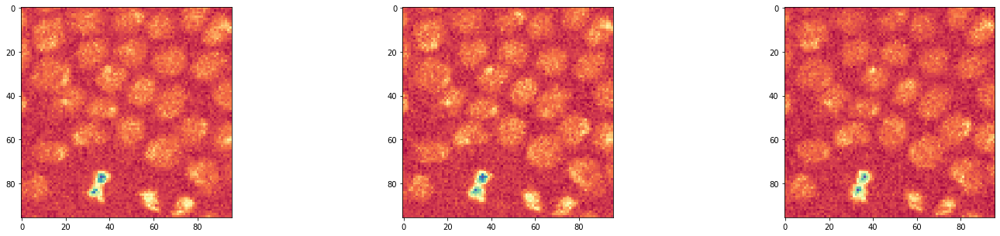

Epoch 53/250
10819/10819 [==============================] - 168s 16ms/step - loss: 1.0698 - accuracy: 0.9387 - val_loss: 1.0681 - val_accuracy: 0.9263

Epoch 00053: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


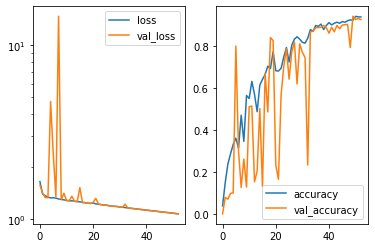

[[8.4340290e-15 2.4466057e-10 1.0000000e+00 4.9202552e-01 5.0029159e-01
  5.0370610e-01 9.9944335e-01 9.9822158e-01 5.0363404e-01]]
True Cell type: BestNuclei
x [[[0.49202552]]]
True positional value x 0.5
y [[[0.5002916]]]
True positional value y 0.5
z [[[0.5037061]]]
True positional value z 0.5
h [[[0.99944335]]]
True positional value h 1.0
w [[[0.9982216]]]
True positional value w 1.0
c [[[0.50363404]]]
True positional value c 1.0


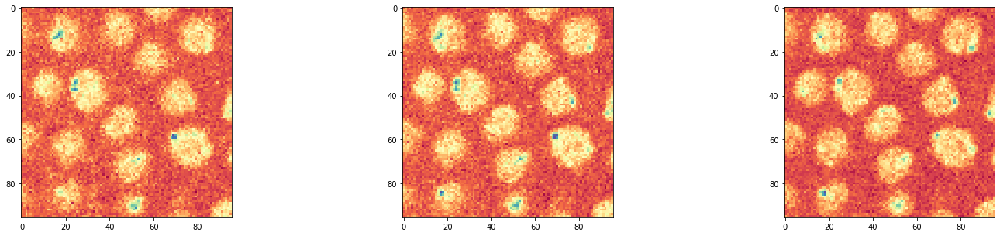

Epoch 54/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.0654 - accuracy: 0.9377 - val_loss: 1.0637 - val_accuracy: 0.9281

Epoch 00054: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


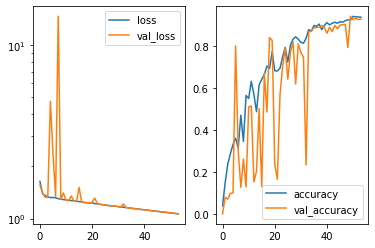

[[2.0529375e-13 5.2457734e-12 1.0000000e+00 5.0432551e-01 5.0230616e-01
  4.9050307e-01 9.9891460e-01 9.9676138e-01 5.2648813e-01]]
True Cell type: BestNuclei
x [[[0.5043255]]]
True positional value x 0.5
y [[[0.50230616]]]
True positional value y 0.5
z [[[0.49050307]]]
True positional value z 0.5
h [[[0.9989146]]]
True positional value h 1.0
w [[[0.9967614]]]
True positional value w 1.0
c [[[0.5264881]]]
True positional value c 1.0


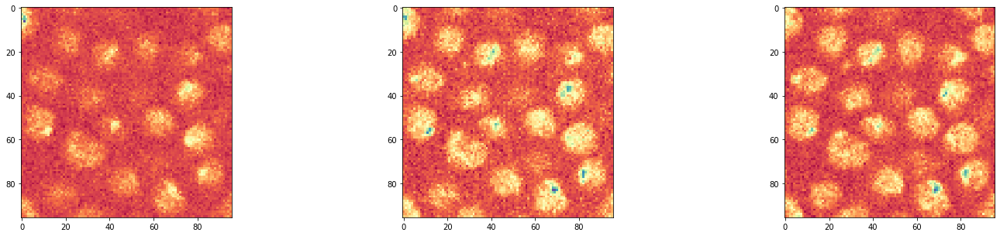

Epoch 55/250
10819/10819 [==============================] - 168s 16ms/step - loss: 1.0611 - accuracy: 0.9372 - val_loss: 1.0594 - val_accuracy: 0.9228

Epoch 00055: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


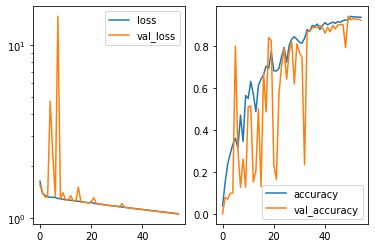

[[1.8411023e-06 9.9999595e-01 2.3053758e-06 4.9249938e-01 5.0155216e-01
  4.9913591e-01 9.9991238e-01 9.9965775e-01 4.9101469e-01]]
True Cell type: BestCad
x [[[0.49249938]]]
True positional value x 0.5
y [[[0.50155216]]]
True positional value y 0.5
z [[[0.4991359]]]
True positional value z 0.5
h [[[0.9999124]]]
True positional value h 1.0
w [[[0.99965775]]]
True positional value w 1.0
c [[[0.4910147]]]
True positional value c 1.0


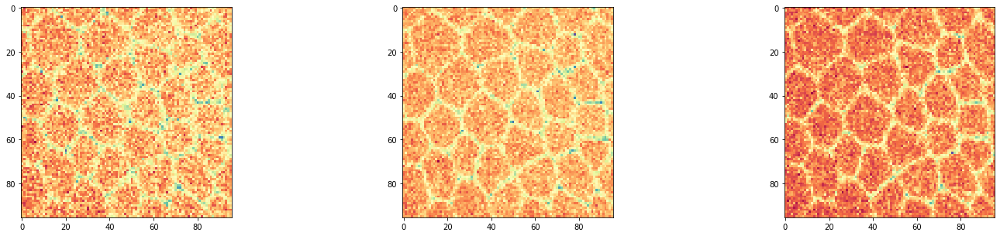

Epoch 56/250
10819/10819 [==============================] - 168s 16ms/step - loss: 1.0569 - accuracy: 0.9394 - val_loss: 1.0552 - val_accuracy: 0.9281

Epoch 00056: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


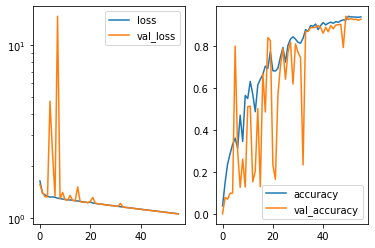

[[9.9998271e-01 1.7342325e-05 1.3919965e-09 5.0010139e-01 4.9830145e-01
  4.9594980e-01 9.9999070e-01 9.9994683e-01 4.5357144e-01]]
True Cell type: Totaloff
x [[[0.5001014]]]
True positional value x 0.5
y [[[0.49830145]]]
True positional value y 0.5
z [[[0.4959498]]]
True positional value z 0.5
h [[[0.9999907]]]
True positional value h 1.0
w [[[0.99994683]]]
True positional value w 1.0
c [[[0.45357144]]]
True positional value c 1.0


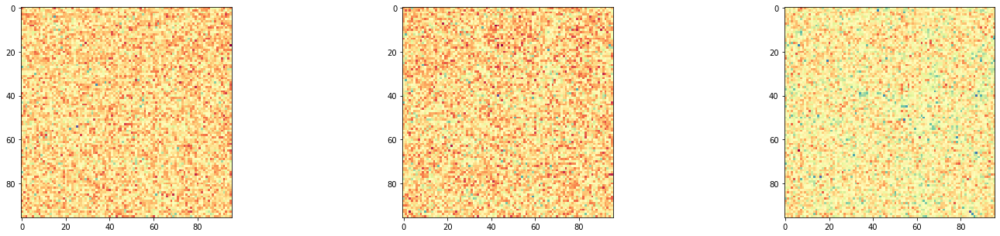

Epoch 57/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.0526 - accuracy: 0.9468 - val_loss: 1.0508 - val_accuracy: 0.9421

Epoch 00057: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


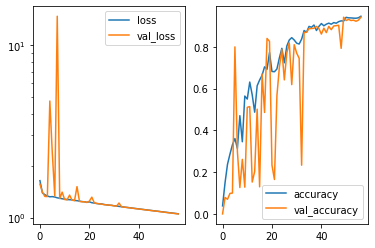

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 8.4344078e-09 7.0422834e-12 5.0575507e-01
    4.9949244e-01 4.9231520e-01 9.9999356e-01 9.9995971e-01
    4.6828619e-01]]]]
True Cell type: Totaloff
x [[[0.50575507]]]
True positional value x 0.5
y [[[0.49949244]]]
True positional value y 0.5
z [[[0.4923152]]]
True positional value z 0.5
h [[[0.99999356]]]
True positional value h 1.0
w [[[0.9999597]]]
True positional value w 1.0
c [[[0.4682862]]]
True positional value c 1.0


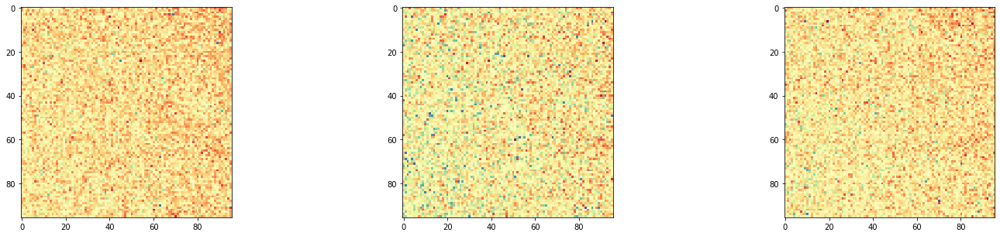

Epoch 58/250
10819/10819 [==============================] - 171s 16ms/step - loss: 1.0483 - accuracy: 0.9444 - val_loss: 1.0467 - val_accuracy: 0.9404

Epoch 00058: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


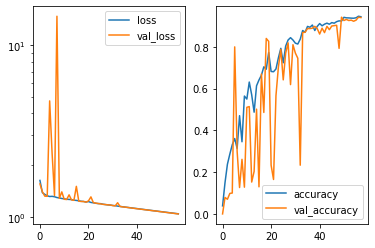

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 2.1600222e-08 4.7772966e-12 4.9779367e-01
    5.0129372e-01 5.0057411e-01 9.9999464e-01 9.9996805e-01
    4.6089551e-01]]]]
True Cell type: Totaloff
x [[[0.49779367]]]
True positional value x 0.5
y [[[0.5012937]]]
True positional value y 0.5
z [[[0.5005741]]]
True positional value z 0.5
h [[[0.99999464]]]
True positional value h 1.0
w [[[0.99996805]]]
True positional value w 1.0
c [[[0.4608955]]]
True positional value c 1.0


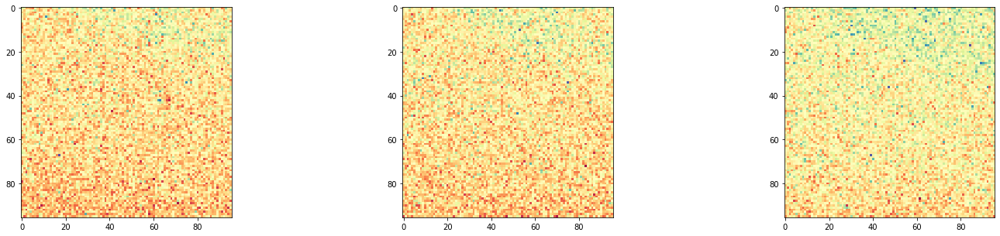

Epoch 59/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.0441 - accuracy: 0.9464 - val_loss: 1.0424 - val_accuracy: 0.9404

Epoch 00059: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


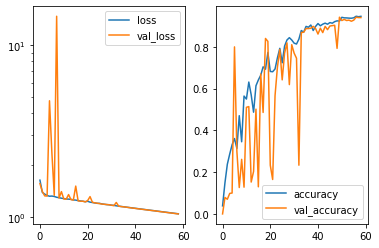

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 7.9262659e-09 2.7922066e-12 4.9369863e-01
    4.9937278e-01 5.0398535e-01 9.9999559e-01 9.9996734e-01
    4.7412124e-01]]]]
True Cell type: Totaloff
x [[[0.49369863]]]
True positional value x 0.5
y [[[0.49937278]]]
True positional value y 0.5
z [[[0.50398535]]]
True positional value z 0.5
h [[[0.9999956]]]
True positional value h 1.0
w [[[0.99996734]]]
True positional value w 1.0
c [[[0.47412124]]]
True positional value c 1.0


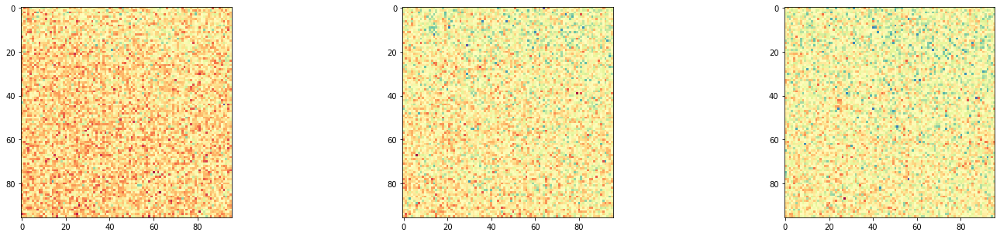

Epoch 60/250
10819/10819 [==============================] - 169s 16ms/step - loss: 1.0399 - accuracy: 0.9486 - val_loss: 1.0382 - val_accuracy: 0.9491

Epoch 00060: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


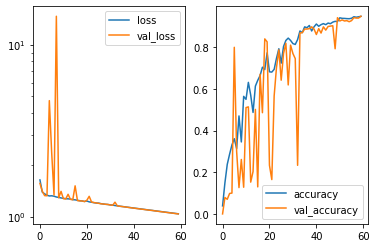

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 4.2957250e-08 5.1896053e-12 5.0069070e-01
    5.0357878e-01 4.9110293e-01 9.9999356e-01 9.9995875e-01
    4.7470576e-01]]]]
True Cell type: Totaloff
x [[[0.5006907]]]
True positional value x 0.5
y [[[0.5035788]]]
True positional value y 0.5
z [[[0.49110293]]]
True positional value z 0.5
h [[[0.99999356]]]
True positional value h 1.0
w [[[0.99995875]]]
True positional value w 1.0
c [[[0.47470576]]]
True positional value c 1.0


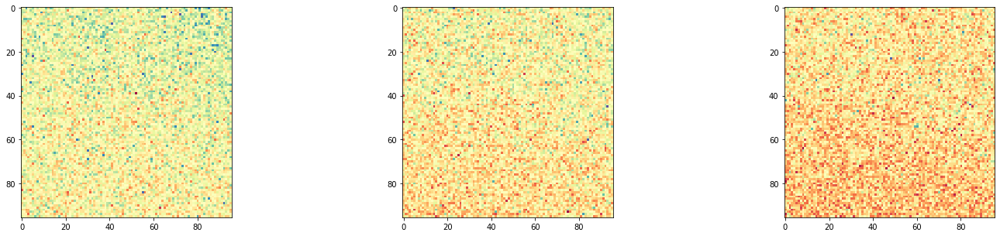

Epoch 61/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.0357 - accuracy: 0.9462 - val_loss: 1.0341 - val_accuracy: 0.9456

Epoch 00061: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


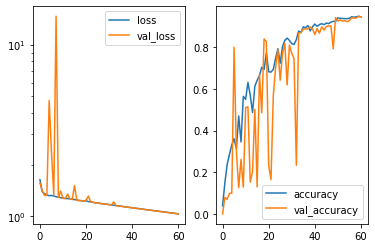

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 9.2134478e-09 2.1573743e-12 4.9509555e-01
    4.9910545e-01 5.0402617e-01 9.9999535e-01 9.9996674e-01
    4.7393361e-01]]]]
True Cell type: Totaloff
x [[[0.49509555]]]
True positional value x 0.5
y [[[0.49910545]]]
True positional value y 0.5
z [[[0.5040262]]]
True positional value z 0.5
h [[[0.99999535]]]
True positional value h 1.0
w [[[0.99996674]]]
True positional value w 1.0
c [[[0.4739336]]]
True positional value c 1.0


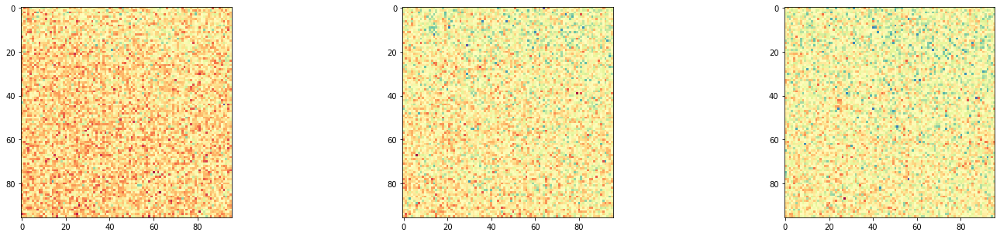

Epoch 62/250
10819/10819 [==============================] - 170s 16ms/step - loss: 1.0316 - accuracy: 0.9475 - val_loss: 1.0299 - val_accuracy: 0.9439

Epoch 00062: saving model to /home/sancere/Kepler/CurieDeepLearningModels/OneatModels/Focusoneatmodels/cadhistoned29s4f16res.h5


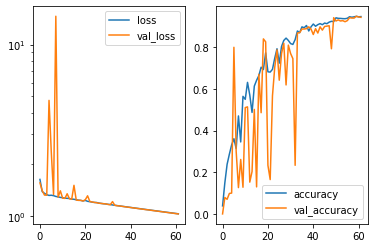

Predicted cell: Totaloff Probability: [[[[1.0000000e+00 2.6179377e-08 3.8006941e-12 4.9785680e-01
    5.0458157e-01 5.0213075e-01 9.9999154e-01 9.9994755e-01
    4.7481894e-01]]]]
True Cell type: Totaloff
x [[[0.4978568]]]
True positional value x 0.5
y [[[0.5045816]]]
True positional value y 0.5
z [[[0.50213075]]]
True positional value z 0.5
h [[[0.99999154]]]
True positional value h 1.0
w [[[0.99994755]]]
True positional value w 1.0
c [[[0.47481894]]]
True positional value c 1.0


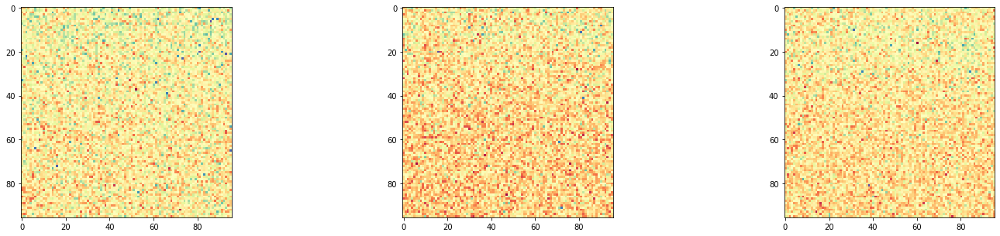

Epoch 63/250
10810/10819 [============================>.] - ETA: 0s - loss: 1.0275 - accuracy: 0.9515

In [ ]:
Train = NEATFocus(config, model_dir, model_name)

Train.loadData()

Train.TrainModel()